# Latent Aspect Rating Analysis and Topic Modelling

**Data:**
Reviews scraped from TripAdvisor (.ipynb notebook included) for Kuredu resort in the Maldives.

This notebook involves, first, splitting reviews into sentences and grouping review sentences into aspects based on aspect keywords. Aspects include: Value, Service, Cleanliness, Facilities/Activities, Location, Rooms, Other. Topic modelling was then used on aspect sentences to generate topics within aspects.

In a business sense, this would help to isolate elements of a resort in order to generate lessons. This could be considered an initial processing stage. After topics are generated from aspects, negative reviews from topics could then be extracted in order to reveal what guests are saying about certain parts of their holiday. For example, within the service aspect, a particular topic could be related to wait staff in restaurants, and negative comments could be identified to find out ways of improving wait staff training.

In [1]:
import pandas as pd
import numpy as np
from pprint import pprint

import sys, string
import nltk
from nltk import FreqDist
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.porter import *
import re
stemmer = PorterStemmer()

import nltk
nltk.download('vader_lexicon')

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/charlottefettes/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


## Generate Aspects and Aspect Ratings from Reviews

In [2]:
#load all review texts
def load_file(file):
    reviews = []
    ratings = []
    f = open(file,'r')
    for line in f:
        l = line.strip().split('>')
        if l[0] == '<Content':
            s = str(l[1])
            reviews.append(s)
        elif l[0] == '<Rating':
            r = l[1].split('\t')
            ratings.append(int(r[1]))
    f.close()
    return reviews , ratings

def parse_to_sentence(reviews):
    review_processed = []
    actual = []
    only_sent = []
    review_num = []
    x = 0
    for r in reviews:
        sentences = nltk.sent_tokenize(r)
        m = len(sentences)
        nums = m*(str(x)+' ').split()
        review_num.append(nums)
        x=int(x)
        x+=1
        actual.append(sentences)
        sent = []
        for s in sentences:
            #words to lower case
            s = s.lower()
            #remove punctuations and stopwords
            replace_punctuation = str.maketrans(string.punctuation, ' '*len(string.punctuation))
            s = s.translate(replace_punctuation)
            stop_words = list(stopwords.words('english'))
            additional_stopwords = ["'s","...","'ve","``","''","'m",'--',"'ll","'d"]
            # additional_stopwords = []
            stop_words = set(stop_words + additional_stopwords)
            # print stop_words
            # sys.exit()
            word_tokens = word_tokenize(s)
            s = [w for w in word_tokens if not w in stop_words]
            #Porter Stemmer
            stemmed = [stemmer.stem(w) for w in s]
            if len(stemmed)>0:
                sent.append(stemmed)
        review_processed.append(sent)
        only_sent.extend(sent)
    return review_processed, actual, only_sent, review_num


def create_vocab(sent):
    words = []
    for s in sent:
        words += s
    freq = FreqDist(words)
    vocab = []
    for k,v in freq.items():
        if v > 5:
            vocab.append(k)
    #Assign a number corresponding to each word. Makes counting easier.
    vocab_dict = dict(zip(vocab, range(len(vocab))))
    return vocab, vocab_dict

In [3]:
import numpy as np
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
##SIA: 
    #positive sentiment: compound score >= 0.5
    #neutral sentiment: (compound score > -0.5) and (compound score < 0.5)
    #negative sentiment: compound score <= -0.5

def get_aspect_terms(file, vocab_dict):
    aspect_terms = []
    w_notfound = []
    f = open(file, "r")
    for line in f:
        s = line.strip().split(",")
        stem = [stemmer.stem(w.strip().lower()) for w in s]
        #store words by their corresponding number.
        #aspect = [vocab_dict[w] for w in stem]
        aspect = []
        for w in stem:
            #if vocab_dict.has_key(w):
            if w in vocab_dict:
                aspect.append(w)
            else:
                w_notfound.append(w)
        aspect_terms.append(aspect)
    #only using one hotel review file, as we keep inceasing the number of files words not found will decrease.
    f.close()
    return aspect_terms

def aspect_segmentation():
    #Sentiment analysis
    sid = SIA()

    #INPUT
    file="KureduReviews_19_04_2020.csv"
    df = pd.read_csv(file)
    reviews = df.TextReview.values
    all_ratings = df.Rating.values

    #selection threshold
    p = 5
    #Iterations 
    I = 1

    #Create Vocabulary
    review_sent, review_actual, only_sent, review_num = parse_to_sentence(reviews)
    vocab, vocab_dict = create_vocab(only_sent)

    #Aspect Keywords
    aspect_file = 'aspect_keywords.csv'
    aspect_terms = get_aspect_terms(aspect_file, vocab_dict)

    label_text = ['Value', 'Rooms', 'Location', 'Cleanliness', 'Service', 'Facilities/Activities','Other']

    #ALGORITHM
    review_labels = []
    k = len(aspect_terms)
    v = len(vocab)
    aspect_words = np.zeros((k,v))
    aspect_sent = np.zeros(k)
    num_words = np.zeros(v)

    for i in range(I):
        for r in review_sent:
            labels = []
            for s in r:
                count = np.zeros(len(aspect_terms))
                i = 0
                for a in aspect_terms:
                    for w in s:
                        #if vocab_dict.has_key(w):
                        if w in vocab_dict:
                            num_words[vocab_dict[w]] += 1
                            if w in a:
                                count[i] += 1
                    i = i + 1
                if max(count) > 0:
                    la = np.where(np.max(count) == count)[0].tolist()
                    labels.append(la)
                    for i in la:
                        aspect_sent[i] += 1
                        for w in s:
                            #if vocab_dict.has_key(w):
                            if w in vocab_dict:
                                aspect_words[i][vocab_dict[w]] += 1
                else:
                    labels.append([])
            review_labels.append(labels)


    ratings_sentiment = []
    for r in review_actual:
        sentiment = []
        #aspect ratings based on sentiment
        for s in r:
            ss = sid.polarity_scores(s)
            sentiment.append(ss['compound'])
        ratings_sentiment.append(sentiment)

    #Aspect Ratings Per Review
    aspect_ratings = []
    for i,r in enumerate(review_labels):
        rating = np.zeros(7)
        count = np.zeros(7)
        rs = ratings_sentiment[i] 
        for j,l in enumerate(r):
            for k in range(7):
                if k in l:
                    rating[k] += rs[j]
                    count[k] +=1
            for k in range(7):
                if count[k] != 0:
                    rating[k] /= count[k]

        aspect_ratings.append(rating)
    return aspect_ratings, all_ratings, review_actual, review_labels, review_num, ratings_sentiment

In [4]:
aspect_ratings, all_ratings, review_actual, review_labels, review_num, ratings_sentiment = aspect_segmentation()

In [5]:
reviews_breakdown = []
for i, j, k, l in zip(review_num, review_actual, review_labels, ratings_sentiment):
    reviews_breakdown.append(list(zip(i, j, k, l)))

In [6]:
df_breakdown = pd.DataFrame([t for lst in reviews_breakdown for t in lst], columns=['ReviewNumber', 'Review','Cat', 'Rating'])

df_breakdown = pd.DataFrame({
      col:np.repeat(df_breakdown[col].values, df_breakdown['Cat'].str.len())
      for col in df_breakdown.columns.drop('Cat')}
    ).assign(**{'Cat':np.concatenate(df_breakdown['Cat'].values)})[df_breakdown.columns]

df_breakdown.head(10)

,ReviewNumber,Review,Cat,Rating
0,0,We stayed in the O villas which were lovely.,1.0,0.5859
1,0,Especially loved our open air bathroom.,1.0,0.6361
2,0,All members of the staff at Kuredu from wait s...,4.0,0.4754
3,0,Our dining room waiter - Shaleef (spelling is...,4.0,0.7269
4,0,When we booked the hotel we were a bit concern...,1.0,0.0000
5,0,Also one night we went to 5.8 the underwater r...,2.0,0.0000
6,0,Also one night we went to 5.8 the underwater r...,4.0,0.0000
7,0,Thanks again to everyone for making this a gre...,5.0,0.8305
8,1,This was our first Maldives holiday and it liv...,0.0,0.4019
9,1,We were greeted by members of staff plying the...,4.0,0.2732


In [7]:
df_breakdown.Rating.describe()

count    39661.000000
mean         0.417162
std          0.397939
min         -0.951200
25%          0.000000
50%          0.526700
75%          0.757400
max          0.996600
Name: Rating, dtype: float64

In [8]:
#save df
df_breakdown.to_csv(r'data/df_breakdown.csv', index = False)

In [9]:
df_breakdown = pd.read_csv('data/df_breakdown.csv')
df_breakdown.head()

,ReviewNumber,Review,Cat,Rating
0,0,We stayed in the O villas which were lovely.,1.0,0.5859
1,0,Especially loved our open air bathroom.,1.0,0.6361
2,0,All members of the staff at Kuredu from wait s...,4.0,0.4754
3,0,Our dining room waiter - Shaleef (spelling is...,4.0,0.7269
4,0,When we booked the hotel we were a bit concern...,1.0,0.0000


In [10]:
#mean rating overall
print('Average rating:', df_breakdown.Rating.mean())
print('Average rating when transformed into the range 1-5: ', (df_breakdown.Rating.mean()+1)*(5/2))

Average rating: 0.4171619550692114
Average rating when transformed into the range 1-5:  3.5429048876730285


[Text(0.5, 0, '')]

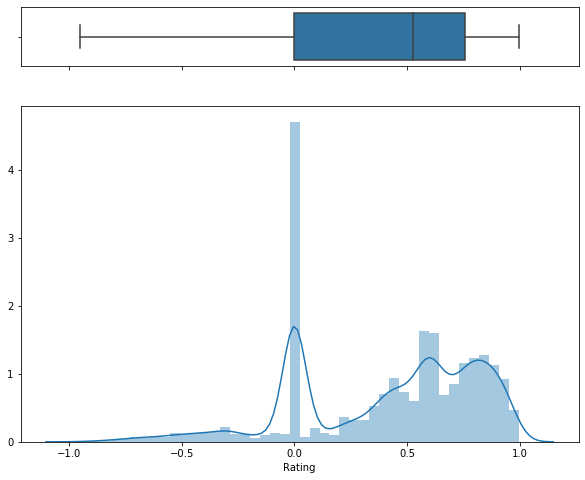

In [11]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_breakdown["Rating"], ax=ax_box)
sns.distplot(df_breakdown["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [12]:
#removing neutral review sentences
df_non_neutral = df_breakdown[df_breakdown.Rating != 0]
df_non_neutral.shape

(31457, 4)

[Text(0.5, 0, '')]

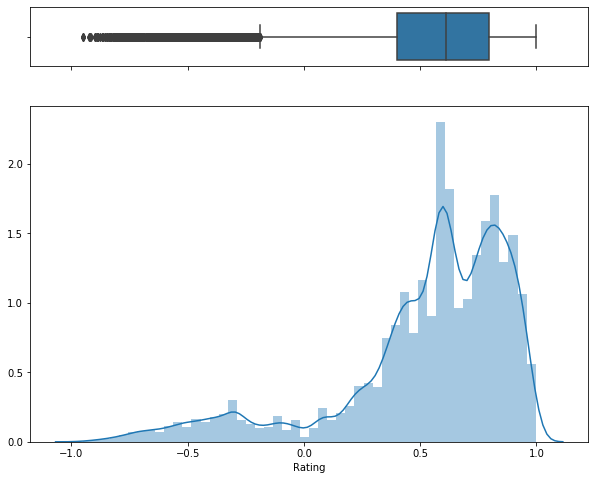

In [13]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_non_neutral["Rating"], ax=ax_box)
sns.distplot(df_non_neutral["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [14]:
#mean rating overall
print('Average rating:', df_non_neutral.Rating.mean())
print('Average rating when transformed into the range 1-5: ', (df_non_neutral.Rating.mean()+1)*(5/2))

Average rating: 0.5259579839145498
Average rating when transformed into the range 1-5:  3.8148949597863746


## Aspect analysis
### Separating aspects

In [15]:
#topic dfs
value_df = df_non_neutral[df_non_neutral.Cat == 0.0].drop('Cat', axis=1)
rooms_df = df_non_neutral[df_non_neutral.Cat == 1.0].drop('Cat', axis=1)
location_df = df_non_neutral[df_non_neutral.Cat == 2.0].drop('Cat', axis=1)
cleanliness_df = df_non_neutral[df_non_neutral.Cat == 3.0].drop('Cat', axis=1)
service_df = df_non_neutral[df_non_neutral.Cat == 4.0].drop('Cat', axis=1)
facilities_df = df_non_neutral[df_non_neutral.Cat == 5.0].drop('Cat', axis=1)
other_df = df_non_neutral[df_non_neutral.Cat == 6.0].drop('Cat', axis=1)

### Helper Functions

In [16]:
# NLTK 
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatisation
import spacy

import os
from gensim.models.wrappers import LdaMallet

# downloaded file from http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
os.environ['MALLET_HOME'] = r'C:/Users/charlottefettes/Documents/KureduReviews/mallet-2.0.8'

mallet_path = 'mallet-2.0.8/bin/mallet'

In [17]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

#define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts, bigram_mod):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, nlp, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [18]:
#function to prep data for model
def data_prep(values):
    data_words = list(sent_to_words(values))

    #build bigram and trigram models
    bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
    trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

    #faster way to get a sentence clubbed as a trigram/bigram
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    trigram_mod = gensim.models.phrases.Phraser(trigram)

    #remove Stop Words
    data_words_nostops = remove_stopwords(data_words)

    #form Bigrams
    data_words_bigrams = make_bigrams(data_words_nostops, bigram_mod)

    #initialise spacy model, keeping only tagger component (for efficiency)
    nlp = spacy.load('en', disable=['parser', 'ner'])

    #lemmatisation keeping only noun, adj, vb, adv
    data_lemmatized = lemmatization(data_words_bigrams, nlp, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

    #create dictionary
    id2word = corpora.Dictionary(data_lemmatized)

    #create corpus
    texts = data_lemmatized

    #term document frequency
    corpus = [id2word.doc2bow(text) for text in texts]
    
    return corpus, data_lemmatized, texts, id2word

In [19]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    #model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=dictionary)
        #model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_value = coherencemodel.get_coherence()
        coherence_values.append(coherence_value)
        print('For {} topics, coherence is {}'.format(num_topics, coherence_value))
    return coherence_values

#### Visualisation and analysis functions

In [20]:
#function to create df for dominant topic and percentage contribution in each document
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        #row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [21]:
#function to generate wordcloud for topics
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

def word_cloud(lda_model, rows, col):
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

    cloud = WordCloud(stopwords=stop_words,
                      background_color='white',
                      width=2500,
                      height=1800,
                      max_words=20,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)

    topics = lda_model.show_topics(formatted=False)

    fig, axes = plt.subplots(rows, col, figsize=(20,15), sharex=True, sharey=True)

    for i, ax in enumerate(axes.flatten()):
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis('off')
    plt.margins(x=0, y=0)
    plt.tight_layout()
    plt.show()

In [22]:
#function to generate plot of weights and counts of topic words per topic
from collections import Counter

def word_count_plot(lda_model, data_lemmatized, rows, cols, ylim_weights_val, ylim_count_val):
    topics = lda_model.show_topics(formatted=False)
    data_flat = [w for w_list in data_lemmatized for w in w_list]
    counter = Counter(data_flat)

    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i , weight, counter[word]])

    df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

    #plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(rows, cols, figsize=(25,20), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
    
    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax_twin.set_ylim(0, ylim_weights_val); ax.set_ylim(0, ylim_count_val)
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
        ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)    
    fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
    plt.show()

In [23]:
#function to reduce dimensionality and generate cluster chart 
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

def tsne_cluster_chart(lda_model, corpus, n_topics):
    #get topic weights
    topic_weights = []
    for i, row_list in enumerate(lda_model[corpus]):
        topic_weights.append([w for i, w in row_list])

    #array of topic weights  
    arr = pd.DataFrame(topic_weights).fillna(0).values

    #keep the well separated points (optional)
    #arr = arr[np.amax(arr, axis=1) > 0.35]

    #dominant topic number in each doc
    topic_num = np.argmax(arr, axis=1)

    #tSNE Dimension Reduction
    tsne_model = TSNE(n_components=2, verbose=0, random_state=0, angle=.99, init='pca')
    tsne_lda = tsne_model.fit_transform(arr)

    #plot the Topic Clusters using Bokeh
    output_notebook()
    n_topics = n_topics
    mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
    plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics),
                  plot_width=900, plot_height=700)
    plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
    show(plot)

In [24]:
#frequency distribution or word counts in documents
def plot_dist_word_count(df):
    doc_lens = [len(d) for d in df.Text]

    #plot
    plt.figure(figsize=(16,7))
    plt.hist(doc_lens, bins = 100, color='navy')
    plt.gca().set(xlim=(0, 100), ylabel='Number of Reviews', xlabel='Review Word Count')
    #plt.tick_params(size=16)
    #plt.xticks(np.linspace(0,100))
    plt.title('Distribution of Review Word Counts', fontdict=dict(size=22))
    plt.show()
    
    
import seaborn as sns
import matplotlib.colors as mcolors

def plot_dist_word_count_topic(row, col, df):
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

    fig, axes = plt.subplots(row,col,figsize=(25,20))

    for i, ax in enumerate(axes.flatten()):    
        df_dominant_topic_sub = df.loc[df.Dominant_Topic == i, :]
        doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
        ax.hist(doc_lens, bins = 100, color=cols[i])
        ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
        sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
        ax.set(xlim=(0, 100), xlabel='Review Word Count')
        ax.set_ylabel('Number of Reviews', color=cols[i])
        ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

    fig.tight_layout()
    fig.subplots_adjust(top=0.90)
    #plt.xticks(np.linspace(0,100,9))
    fig.suptitle('Distribution of Review Word Counts by Dominant Topic', fontsize=22)
    plt.show()

In [25]:
import math
import graph_tool.all as gt

class Visualization:
    'class to aggregate fine tuning of graph_tool'
    
    color_map = {0: [0.2, 0.2, 0.2, 0.2], 1: [0.3, 0.2, 0.7, 0.2], 2: [0.3, 0.2, 0.2, 0.7],
            3: [0.4, 0.7, 0.7, 0.2], 4: [0.4, 0.2, 0.7, 0.7], 5: [0.4, 0.7, 0.2, 0.7],
            6: [0.4, 0.0, 0.0, 0.5], 7: [0.4, 0.5, 0.0, 0.5], 8: [0.4, 0.5, 0.5, 0.1],
            9: [0.5, 0.7, 0.7, 0.7]}
    
    def __init__(self, root_label="all reviews", term_count=100, 
                 root_color=[0.640625, 0, 0, 0.9], root_font_size=18):
        self.g = gt.Graph()
        
        self.vprop_label = self.g.new_vertex_property("string")
        self.text_position = self.g.new_vertex_property("float")
        self.text_rotation = self.g.new_vertex_property("float")
        self.fill_color = self.g.new_vertex_property("vector<float>")
        self.font_size = self.g.new_vertex_property("int")
        self.vertex_size = self.g.new_vertex_property("int")
        self.marker_size = self.g.new_edge_property("float")
        self.text_offset = self.g.new_vertex_property("vector<float>")

        self.root = self.g.add_vertex()
        self.vprop_label[self.root] = root_label
        self.text_position[self.root] = -1
        self.text_rotation[self.root] = 0
        self.fill_color[self.root] = root_color
        self.font_size[self.root] = root_font_size
        self.text_offset[self.root] = [0.0, 0.0]
        
        self.angle = 0.0
        self.position = 0.0
        self.first_turn = True
        self.cur_text_offset = [-0.07, 0.0]
        self.topic_idx = 0
        self.cur_term_color = Visualization.color_map[0]
        
        self.angle_step = 2 * math.pi / term_count
    
    def add_topic(self, label, root=None, vcolor=[0.4, 0, 0, 0.9], voffset=[0.0, 0.0], 
                  emarker_size=2.0, vfont_size=16):
        vtopic = self.g.add_vertex()
        
        self.vprop_label[vtopic] = label
        self.text_position[vtopic] = -1
        self.text_rotation[vtopic] = 0
        self.fill_color[vtopic] = vcolor
        self.font_size[vtopic] = vfont_size
        self.text_offset[vtopic] = voffset
    
        if root == None:
            root = self.root
            
        e = self.g.add_edge(root, vtopic)
        self.marker_size[e] = emarker_size
        
        self.cur_term_color = Visualization.color_map[self.topic_idx % 10]
        self.topic_idx += 1
        
        return vtopic
    
    def add_term(self, vtopic, term, vfont_size=20, emarker_size=1.0, weight=1.0, vertex_size=50):
        vterm = self.g.add_vertex()
        self.vprop_label[vterm] = term.encode('utf8')
        self.text_position[vterm] = self.position
        self.text_rotation[vterm] = self.angle
        
        self.fill_color[vterm] = self.cur_term_color
        self.fill_color[vterm][3] *= weight 
        
        self.font_size[vterm] = vfont_size
        self.text_offset[vterm] = self.cur_text_offset
        
        self.text_offset[vterm][0] *= vertex_size / 50.0
        self.text_offset[vterm][1] *= vertex_size / 50.0
        
        self.vertex_size[vterm] = vertex_size
                     
        et = self.g.add_edge(vtopic, vterm)
        self.marker_size[et] = emarker_size
        
        self.increaseAngle(vertex_size)
        
    def increaseAngle(self, vertex_size):
        self.angle += self.angle_step

        if self.angle > math.pi / 2.0: 
            if self.first_turn:
                self.angle *= -1.0
                self.position = math.pi
                self.first_turn = False
                self.cur_text_offset = [0.07, 0.0]
            else:
                self.angle *= -1
                self.position = 0
                self.cur_text_offset = [-0.07, 0.0]

        
    def draw(self, file_name, output_size=(1980, 1980)): 
        pos = gt.radial_tree_layout(self.g, self.root)
        
        gt.graph_draw(self.g, vertex_text=self.vprop_label, vertex_text_position=self.text_position,\
                      vertex_text_rotation=self.text_rotation, vertex_fill_color=self.fill_color,\
                      output=file_name, output_size=output_size, inline=True, vertex_font_size=self.font_size,\
                      edge_marker_size=self.marker_size, vertex_text_offset=self.text_offset,\
                      vertex_size=self.vertex_size, pos=pos, fit_view=0.9)

### Value Aspect

In [26]:
value_df.head(10)

,ReviewNumber,Review,Rating
8,1,This was our first Maldives holiday and it liv...,0.4019
61,6,Great staff; very accommodating.,0.6249
63,6,Beautiful island with beautiful accommodations.,0.8316
64,6,Saw lots and lots of fish and manta rays; Easi...,0.3400
70,8,The island has now become more defined into 3 ...,0.4902
77,9,All bookings were entrusted to Caper Travel in...,0.4201
79,10,We spent 7 days on the island and from the mom...,0.3724
84,10,I would definitely recommend this island and h...,0.7964
108,16,Recommend that you buy All inclusive plus and ...,0.6369
112,18,For you visiting Kuredo I can warmly recommend...,0.6696


In [27]:
value_df.shape

(2604, 3)

In [28]:
#mean rating overall
print('Average value rating:', value_df.Rating.mean())
print('Average value rating when transformed into the range 1-5: ', (value_df.Rating.mean()+1)*(5/2))

Average value rating: 0.46007100614439567
Average value rating when transformed into the range 1-5:  3.6501775153609897


[Text(0.5, 0, '')]

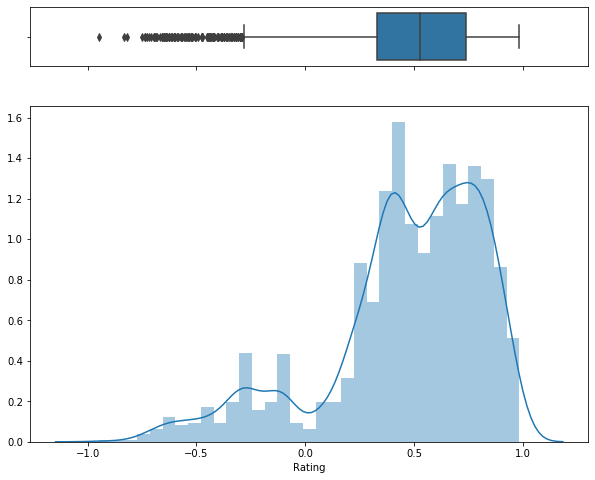

In [29]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(value_df["Rating"], ax=ax_box)
sns.distplot(value_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data Prep

In [30]:
rev_values = value_df.Review.values

corpus_values, data_lemmatized_values, texts_values, id2word_values = data_prep(rev_values)

#### Modelling

In [31]:
#topics within value

#coherence_values = compute_coherence_values(dictionary=id2word_values,
#                                                   corpus=corpus_values,
#                                                   texts=data_lemmatized_values,
#                                                   start=2,
#                                                   limit=10,
#                                                   step=2)

In [32]:
#%matplotlib inline
#import matplotlib.pyplot as plt

##plot graph
#limit=12; start=4; step=1;
#x = range(start, limit, step)
#plt.plot(x, coherence_values_mallet)
#plt.xlabel("Number of topics")
#plt.ylabel("Coherence score")
#plt.legend(("coherence_values"), loc='best')
#plt.show()

In [33]:
K = 8

gensim_lda_value = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_values,
                                                    num_topics=K,
                                                    id2word=id2word_values,
                                                    iterations=1000,
                                                    random_seed=1234)

In [34]:
#compute coherence score
#coherence_model_mallet = CoherenceModel(model=gensim_lda_value, texts=data_lemmatized_values, dictionary=id2word_values, coherence='c_v')
#coherence_mallet = coherence_model_mallet.get_coherence()
#print('\nCoherence Score for LDA Mallet: ', coherence_mallet)

In [35]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_value.show_topics(num_topics=10, num_words=10, formatted=False))

[(0,
  [('inclusive', 0.09129511677282377),
   ('expensive', 0.07112526539278131),
   ('cost', 0.044585987261146494),
   ('day', 0.0435244161358811),
   ('package', 0.040339702760084924),
   ('make', 0.03980891719745223),
   ('night', 0.029723991507430998),
   ('week', 0.027600849256900213),
   ('fantastic', 0.027070063694267517),
   ('include', 0.016985138004246284)]),
 (1,
  [('expect', 0.10095642933049948),
   ('kuredu', 0.0924548352816153),
   ('maldive', 0.08023379383634431),
   ('time', 0.07279489904357067),
   ('island', 0.06269925611052073),
   ('visit', 0.062167906482465465),
   ('trip', 0.03825717321997875),
   ('wonderful', 0.02763018065887354),
   ('end', 0.014346439957492029),
   ('staff', 0.01381509032943677)]),
 (2,
  [('good', 0.15086206896551724),
   ('quality', 0.08620689655172414),
   ('food', 0.06896551724137931),
   ('vacation', 0.06896551724137931),
   ('place', 0.0625),
   ('high', 0.03825431034482758),
   ('back', 0.03771551724137931),
   ('choice', 0.0199353448

In [36]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_values = format_topics_sentences(gensim_lda_value, corpus_values, data_lemmatized_values)

#format
df_dominant_topic_values = df_topic_sents_keywords_values.reset_index()
df_dominant_topic_values.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_values.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.1713,"price, expectation, island, experience, room, ...","[holiday, live, exceed, expectation]"
1,1,7.0,0.1494,"resort, holiday, great, perfect, spend, relax,...","[great, staff, accommodate]"
2,2,6.0,0.1587,"accommodation, stay, excellent, beach, villa, ...","[beautiful, accommodation]"
3,3,2.0,0.1614,"good, quality, food, vacation, place, high, ba...","[see, lot, lot, fish, ray, easily, accommodate..."
4,4,7.0,0.1473,"resort, holiday, great, perfect, spend, relax,...","[become, define, resort, choose, accommodation..."
5,5,3.0,0.1681,"price, expectation, island, experience, room, ...","[booking, entrust, service, expectation, price..."
6,6,3.0,0.1528,"price, expectation, island, experience, room, ...","[spend, moment, get, expectation, disappoint]"
7,7,0.0,0.1590,"inclusive, expensive, cost, day, package, make...","[would, definitely, recommend, hope, day, return]"
8,8,0.0,0.1601,"inclusive, expensive, cost, day, package, make...","[buy, inclusive, book, holiday, least, day]"
9,9,1.0,0.1368,"expect, kuredu, maldive, time, island, visit, ...","[visit, warmly, recommend]"


In [37]:
#combine with raw review text, wort by topic and save
value_df.reset_index(drop=True, inplace=True)
df_dominant_topic_values.reset_index(drop=True, inplace=True)

df_value = pd.concat([df_dominant_topic_values, value_df], axis=1)
df_value = df_value.sort_values(by=['Dominant_Topic'])

#save
df_value.to_csv(r'data/df_value_topics.csv', index = False)

In [38]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_values = pd.DataFrame()
sent_topics_outdf_grpd_values = df_topic_sents_keywords_values.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_values:
    sent_topics_sorteddf_values = pd.concat([sent_topics_sorteddf_values, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_values.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_values.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_values.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.2208,"inclusive, expensive, cost, day, package, make, night, week, fantastic, include","[tier, inclusive, tier, expensive, well, choice, people, meet, last, week, think, inclusive, inc..."
1,1.0,0.2238,"expect, kuredu, maldive, time, island, visit, trip, wonderful, end, staff","[trip, kuredu, complete, day, rather, rigid, schedule, friendly, travel, kuredu, give, insight, ..."
2,2.0,0.2782,"good, quality, food, vacation, place, high, back, choice, enjoy, fish","[frendly, enjoy, much, beatiful, place, food, good, room, clean, much, think, need, vacation, ho..."
3,3.0,0.2387,"price, expectation, island, experience, room, atmosphere, feel, people, exceed, give","[go, day, dream, island, really, worth, girlfriend, birthday, order, romantic, dinner, beach, ha..."
4,4.0,0.2380,"worth, pay, money, water, extra, lot, thing, bit, choose, villas","[thing, ice, entertainment, system, flight, long, flight, yet, film, choose, programme, compare,..."
5,5.0,0.2149,"recommend, highly, friend, amazing, honeymoon, love, family, couple, hotel, due","[would, highly, recommend, honeymooner, friend, family, solo, traveller]"
6,6.0,0.2226,"accommodation, stay, excellent, beach, villa, beautiful, nice, long, service, view","[perhaps, somewhat, sceptical, quality, accommodation, environment, soon, dispel, enter, beach, ..."
7,7.0,0.2300,"resort, holiday, great, perfect, spend, relax, return, offer, travel, year","[first, trip, adult, many, year, family, vacation, resort, overall, great, many, purpose, resort..."


In [39]:
sent_topics_sorteddf_values.to_csv(r'data/sent_topics_sorteddf_values.csv', index = False)

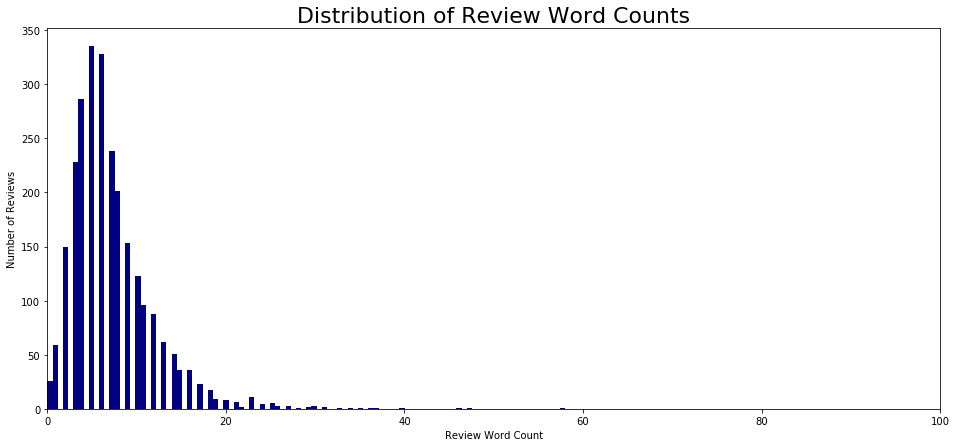

In [40]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_values)

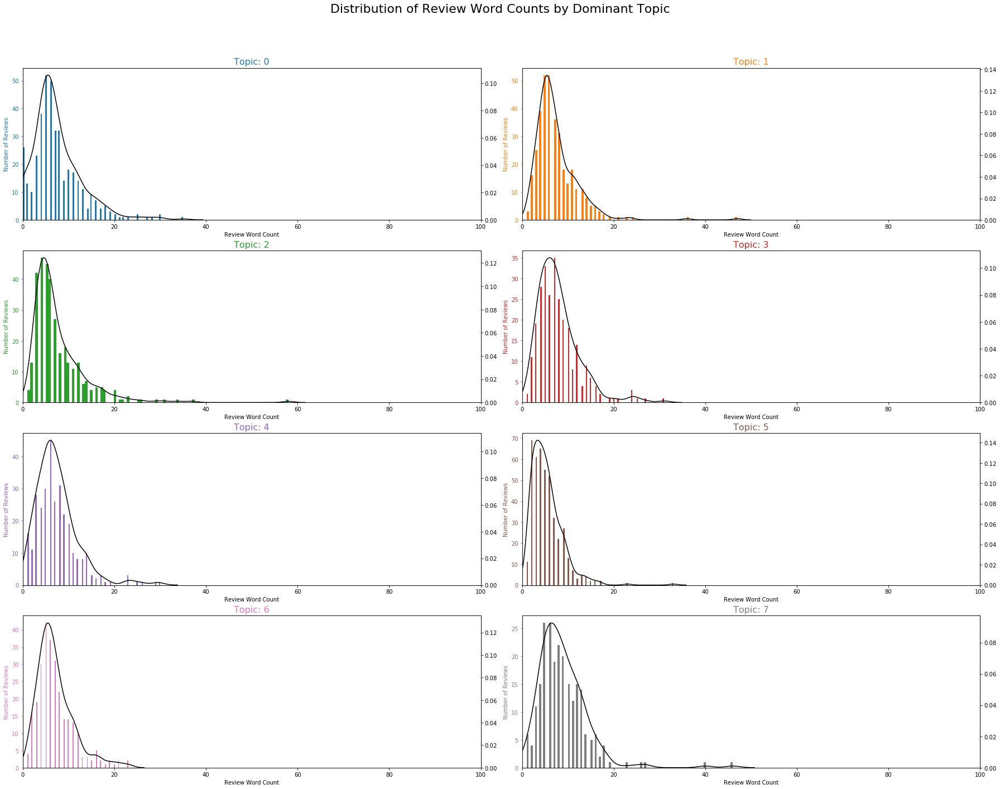

In [41]:
plot_dist_word_count_topic(4, 2, df_dominant_topic_values)

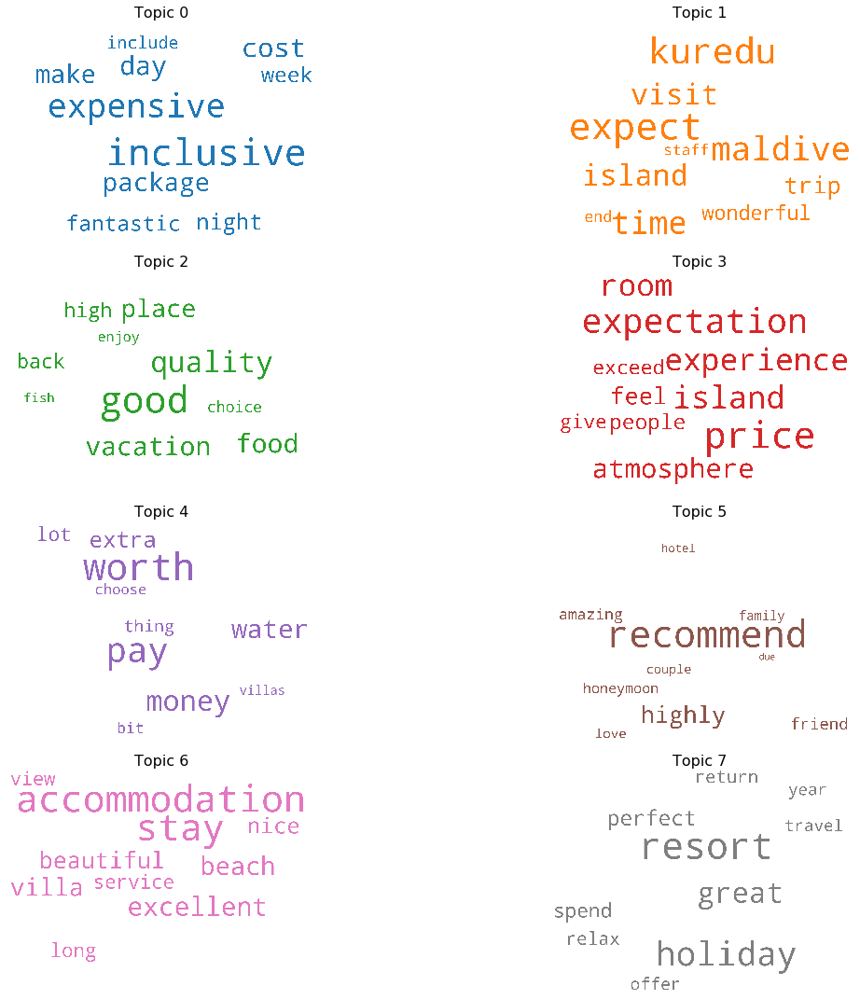

In [42]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_value, 4, 2)

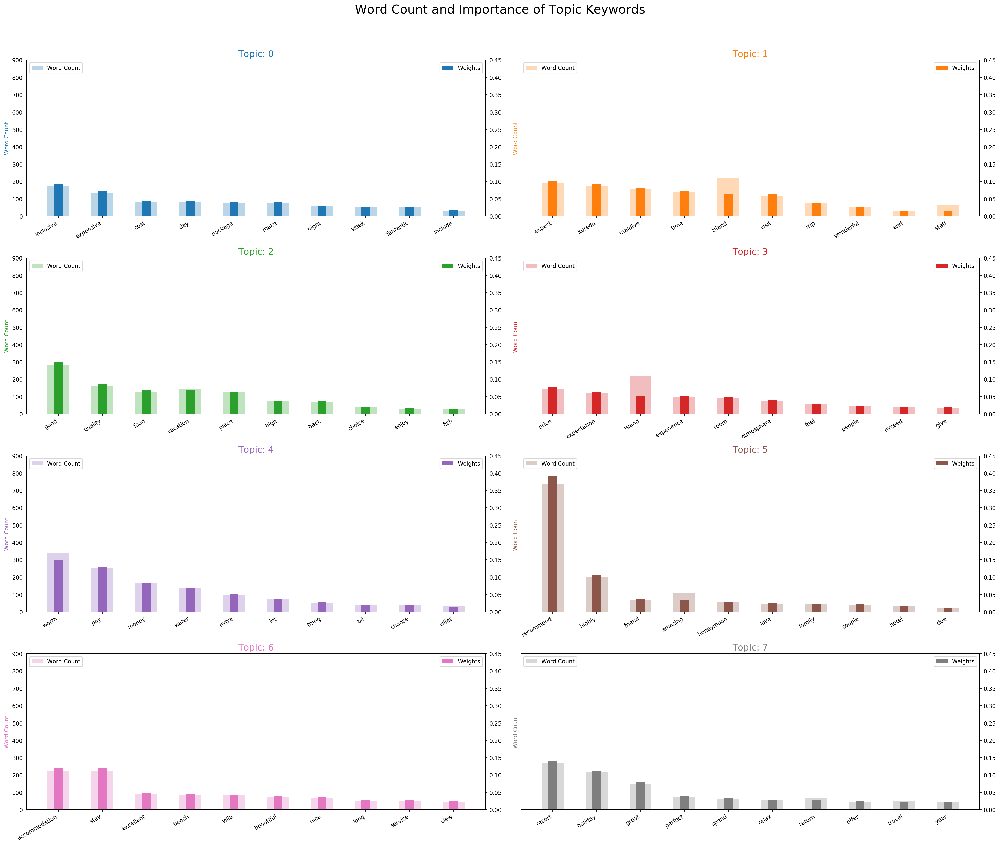

In [43]:
#Word counts of topic keywords
word_count_plot(gensim_lda_value, data_lemmatized_values, 4, 2, 0.45, 900)

In [44]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_value, corpus_values, K)

Loading BokehJS ...

In [45]:
#pyLDAVis
import pyLDAvis.gensim

model2 = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_value)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2, corpus_values, dictionary=id2word_values)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.136961 -0.053424       1        1  12.626453
1      0.094960  0.244675       2        1  12.564409
4     -0.293007  0.021719       3        1  12.555761
3      0.086201  0.261643       4        1  12.551688
7      0.123136 -0.201714       5        1  12.535161
2      0.112725  0.028090       6        1  12.523452
6     -0.330433 -0.026181       7        1  12.418398
5      0.069456 -0.274808       8        1  12.224678, topic_info=          Term        Freq       Total Category  logprob  loglift
39   recommend  903.000000  903.000000  Default  30.0000  30.0000
52        good  356.000000  356.000000  Default  29.0000  29.0000
75       worth  412.000000  412.000000  Default  28.0000  28.0000
25      resort  331.000000  331.000000  Default  27.0000  27.0000
62         pay  307.000000  307.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
659      point   13.500020   14.761401   Topic8  -5.1422   2.0124
105    amazing   78.545568  132.133367   Topic8  -3.3812   1.5816
258       base    9.818196   12.309930   Topic8  -5.4606   1.8755
148    relaxed   11.045471   23.781862   Topic8  -5.3429   1.3348
423       shop   11.045471   26.780017   Topic8  -5.3429   1.2161

[534 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
1059      8  0.814814           abit
71        5  1.009790     absolutely
4         7  1.001674    accommodate
7         2  0.003531  accommodation
7         7  0.995678  accommodation
...     ...       ...            ...
75        3  0.863057          worth
75        7  0.138186          worth
988       3  0.826207         worthy
2256      5  0.802654          woudl
153       5  1.007984           year

[569 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 5, 4, 8, 3, 7, 6])

In [46]:
pyLDAvis.save_html(vis, 'value_topics_pyldavis.html')

In [47]:
value_vis = Visualization()

for i, item in enumerate(gensim_lda_value.show_topics(num_topics=10, num_words=10, formatted=False)):
    vtopic = value_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        value_vis.add_term(vtopic, term, weight=weight / maxWeight)

value_vis.draw("value_topics_vis.png")

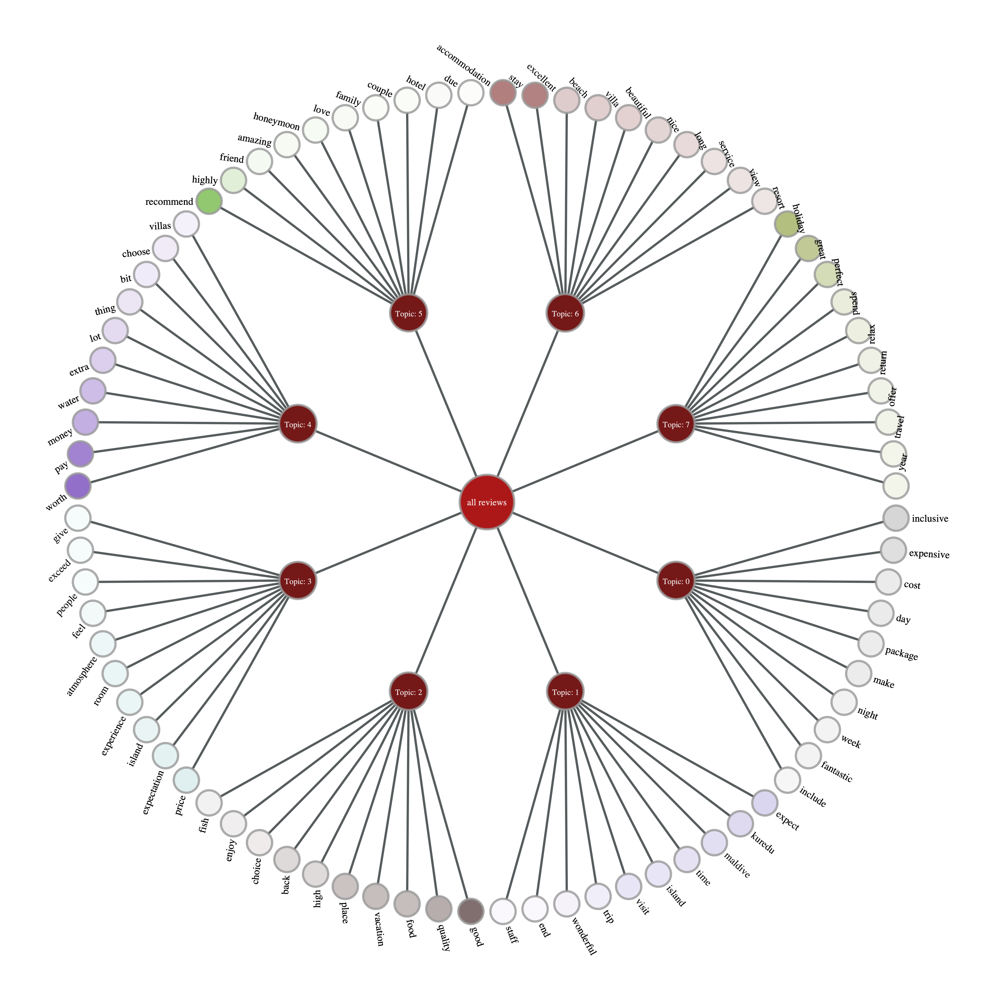

In [48]:
from IPython.display import Image 

Image("value_topics_vis.png")

### Rooms Aspect

In [49]:
rooms_df.head()

,ReviewNumber,Review,Rating
0,0,We stayed in the O villas which were lovely.,0.5859
1,0,Especially loved our open air bathroom.,0.6361
13,1,Our villa was spotless and just what you need to relax.,0.4404
25,2,The insides needed a complete modernisation as there were several issues that let it down badly.,-0.4767
42,4,We had booked with friends the Sangu Water Villas for 2 nights & Jacuzzi Beach Villa for 5.,0.4767


In [50]:
rooms_df.shape

(5712, 3)

In [51]:
#mean rating overall
print('Average room rating:', value_df.Rating.mean())
print('Average room rating when transformed into the range 1-5: ', (value_df.Rating.mean()+1)*(5/2))

Average room rating: 0.46007100614439567
Average room rating when transformed into the range 1-5:  3.6501775153609897


[Text(0.5, 0, '')]

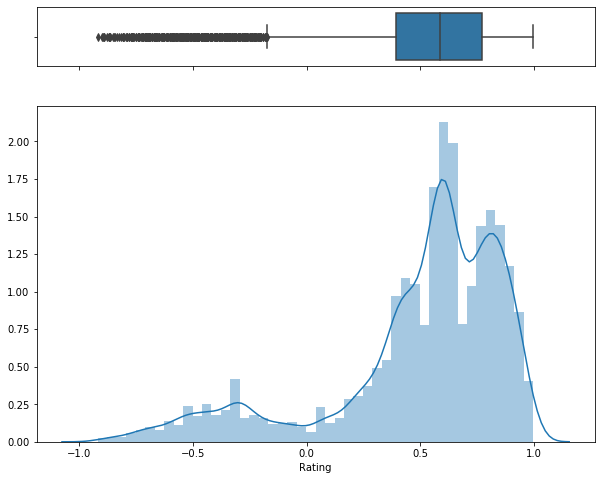

In [52]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(rooms_df["Rating"], ax=ax_box)
sns.distplot(rooms_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [53]:
rooms_vals = rooms_df.Review.values

corpus_rooms, data_lemmatized_rooms, texts_rooms, id2word_rooms = data_prep(rooms_vals)

#### Topic modelling

In [54]:
K = 6

gensim_lda_rooms = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_rooms,
                                                    num_topics=K,
                                                    id2word=id2word_rooms,
                                                    iterations=1000,
                                                    random_seed=1)

In [55]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_rooms.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('book', 0.07850994360344316),
   ('good', 0.07019887206886316),
   ('resort', 0.05431878895814782),
   ('holiday', 0.0365093499554764),
   ('kuredu', 0.03279905016325319),
   ('review', 0.030276046304541407),
   ('read', 0.029385574354407838),
   ('place', 0.025378450578806767),
   ('excellent', 0.021519738794894626),
   ('maldive', 0.017809439002671415),
   ('spend', 0.017364203027604632),
   ('year', 0.015138023152270703),
   ('flight', 0.014247551202137132),
   ('visit', 0.013060255268625705),
   ('trip', 0.012021371326803205),
   ('request', 0.012021371326803205),
   ('return', 0.011724547343425349),
   ('choice', 0.011130899376669634),
   ('inclusive', 0.010982487384980706),
   ('start', 0.010537251409913921),
   ('extra', 0.010092015434847135),
   ('friend', 0.00964677945978035),
   ('long', 0.009349955476402494),
   ('choose', 0.009053131493024636),
   ('hour', 0.009053131493024636),
   ('travel', 0.008607895517957851),
   ('decide', 0.007569011576135352),
   ('put', 0.

In [56]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_rooms = format_topics_sentences(gensim_lda_rooms, corpus_rooms, data_lemmatized_rooms)

#format
df_dominant_topic_rooms = df_topic_sents_keywords_rooms.reset_index()
df_dominant_topic_rooms.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_rooms.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,4.0,0.1795,"room, bed, clean, lovely, bathroom, comfortable, nice, shower, accommodation, spacious","[stay, lovely]"
1,1,4.0,0.1795,"room, bed, clean, lovely, bathroom, comfortable, nice, shower, accommodation, spacious","[especially, love, bathroom]"
2,2,0.0,0.1728,"book, good, resort, holiday, kuredu, review, read, place, excellent, maldive","[villa, spotless, nee, relax]"
3,3,4.0,0.2202,"room, bed, clean, lovely, bathroom, comfortable, nice, shower, accommodation, spacious","[inside, need, complete, modernisation, several, issue, let, badly]"
4,4,0.0,0.1950,"book, good, resort, holiday, kuredu, review, read, place, excellent, maldive","[book, friend, water]"
5,5,1.0,0.1887,"villa, stay, beach, water, upgrade, week, recommend, enjoy, worth, arrive","[remain, water, week]"
6,6,5.0,0.1960,"water, day, night, make, love, back, fish, restaurant, staff, food","[incredible, variety, fish, simply, stunning]"
7,7,5.0,0.2126,"water, day, night, make, love, back, fish, restaurant, staff, food","[experience, quarantine, ship, awful, condition, continue, treat, royally]"
8,8,0.0,0.2385,"book, good, resort, holiday, kuredu, review, read, place, excellent, maldive","[incredible, resilience, management, proud, team, conduct, period, hope, guest, continue, visit,..."
9,9,4.0,0.2166,"room, bed, clean, lovely, bathroom, comfortable, nice, shower, accommodation, spacious","[rat, false, ceiling, bungalow, wake, squeak, scratch, night, nice]"


In [57]:
#combine with raw review text, wort by topic and save
rooms_df.reset_index(drop=True, inplace=True)
df_dominant_topic_rooms.reset_index(drop=True, inplace=True)

df_rooms = pd.concat([df_dominant_topic_rooms, rooms_df], axis=1)
df_rooms = df_rooms.sort_values(by=['Dominant_Topic'])

#save
df_rooms.to_csv(r'data/df_rooms_topics.csv', index = False)

In [58]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_rooms = pd.DataFrame()
sent_topics_outdf_grpd_rooms = df_topic_sents_keywords_rooms.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_rooms:
    sent_topics_sorteddf_rooms = pd.concat([sent_topics_sorteddf_rooms, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_rooms.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_rooms.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_rooms.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.3600,"book, good, resort, holiday, kuredu, review, read, place, excellent, maldive","[know, want, make, reservation, honeymoon, look, best, good, week, marriage, read, review, decid..."
1,1.0,0.2857,"villa, stay, beach, water, upgrade, week, recommend, enjoy, worth, arrive","[closer, end, week, also, offer, free, upgrade, water, villa, decide, stay, grateful, offer, case]"
2,2.0,0.3134,"view, great, amazing, sea, beautiful, villas, fantastic, experience, plane, stunning","[reach, transfer, plane, male, kuredu, experience, little, noisy, take, earplug, help, unbelieva..."
3,3.0,0.3005,"bungalow, stay, island, time, perfect, quiet, area, feel, lot, side","[prefer, meet, people, find, other, main, area, prefer, quiet, time, easily, find]"
4,4.0,0.3123,"room, bed, clean, lovely, bathroom, comfortable, nice, shower, accommodation, spacious","[strange, use, outside, bathroom, first, time, soon, get, use, benefit, keep, steam, bedroom, ot..."
5,5.0,0.2870,"water, day, night, make, love, back, fish, restaurant, staff, food","[day, birthday, bed, decorate, fresh, flower, well, table, dinner, birthday, cake]"


In [59]:
sent_topics_sorteddf_rooms.to_csv(r'data/sent_topics_sorteddf_rooms.csv', index = False)

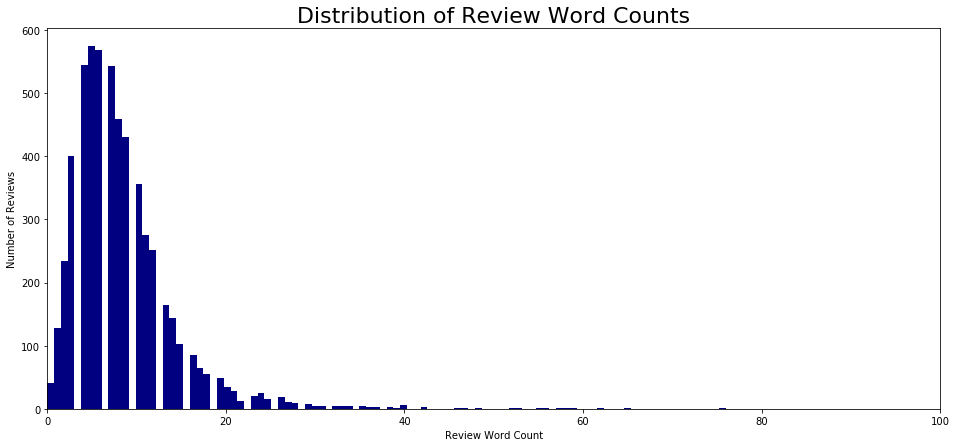

In [60]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_rooms)

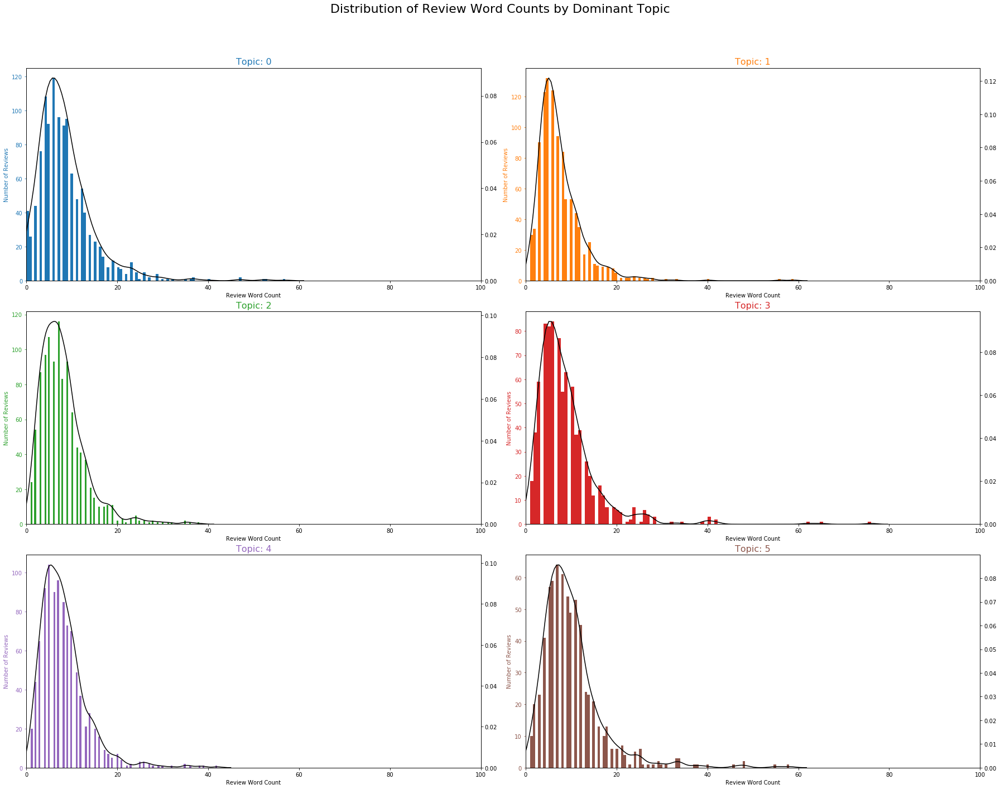

In [61]:
plot_dist_word_count_topic(3, 2, df_dominant_topic_rooms)

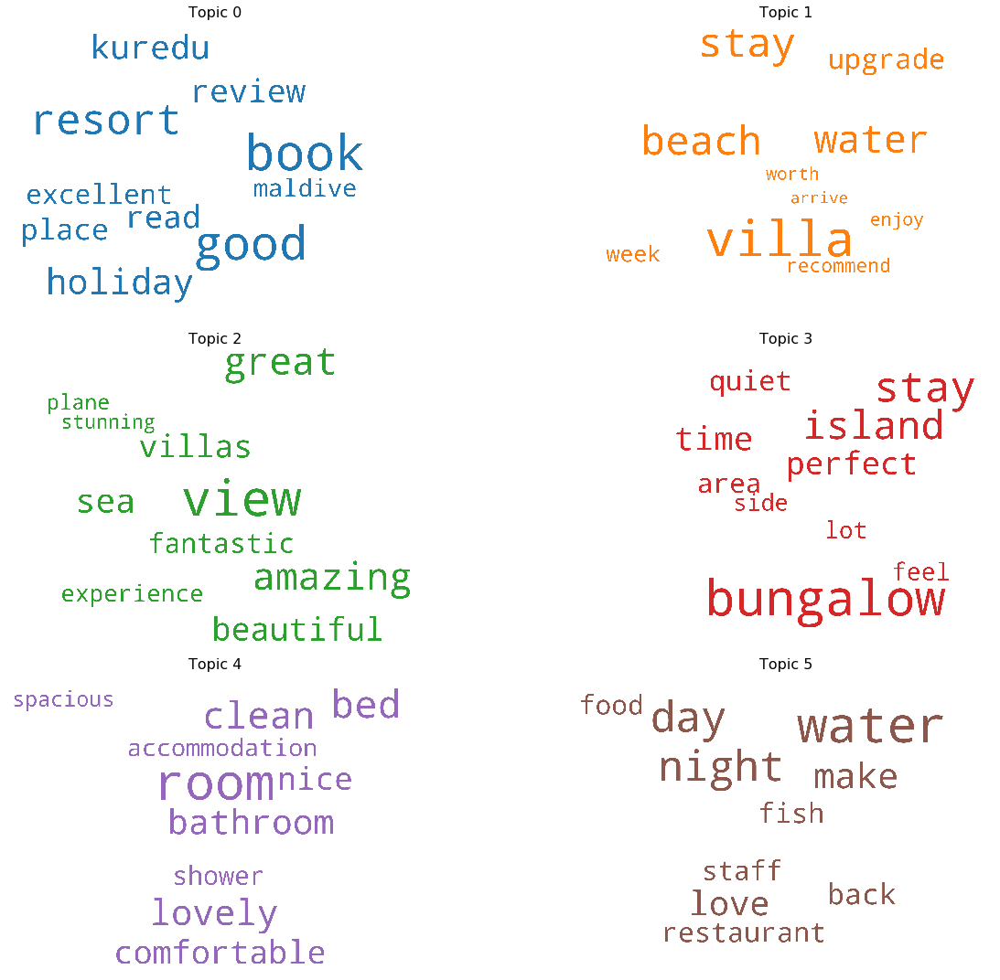

In [62]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_rooms, 3, 2)

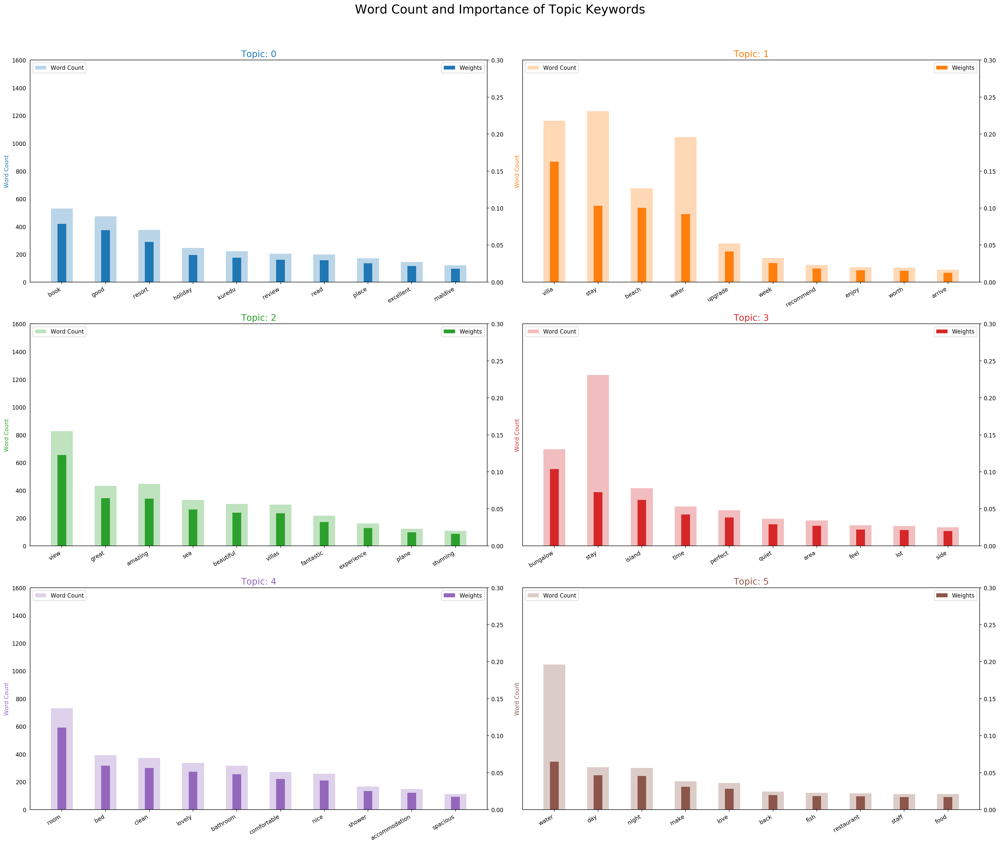

In [63]:
#Word counts of topic keywords
word_count_plot(gensim_lda_rooms, data_lemmatized_rooms, 3, 2, 0.30, 1600)

In [64]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_rooms, corpus_rooms, K)

Loading BokehJS ...

In [65]:
#pyLDAVis
import pyLDAvis.gensim

model2_rooms = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_rooms)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_rooms, corpus_rooms, dictionary=id2word_rooms)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.162433  0.044231       1        1  16.818169
5     -0.192828 -0.066182       2        1  16.775562
3     -0.143422  0.107448       3        1  16.699713
1     -0.273498  0.010814       4        1  16.590642
2      0.193056 -0.374327       5        1  16.583513
4      0.254258  0.278016       6        1  16.532401, topic_info=         Term         Freq        Total Category  logprob  loglift
8       villa  1374.000000  1374.000000  Default  30.0000  30.0000
156      view   976.000000   976.000000  Default  29.0000  29.0000
80       room   879.000000   879.000000  Default  28.0000  28.0000
63   bungalow   831.000000   831.000000  Default  27.0000  27.0000
139     beach   798.000000   798.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
440  overlook    45.767862    46.962873   Topic6  -5.1550   1.7741
58       walk    91.535724   102.501608   Topic6  -4.4618   1.6867
527    plenty    52.994367    63.753674   Topic6  -5.0084   1.6150
468      work    54.198784    66.148893   Topic6  -4.9859   1.6006
296       boy    43.359027    56.761775   Topic6  -5.2090   1.5305

[424 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
382       2  0.121926     absolutely
382       4  0.872241     absolutely
169       5  0.990521         access
2150      4  0.847465       accident
73        6  0.997447  accommodation
...     ...       ...            ...
468       6  0.816340           work
60        3  1.009097          world
785       3  0.996205          worry
61        4  1.003794          worth
622       1  0.998884           year

[442 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 6, 4, 2, 3, 5])

In [66]:
pyLDAvis.save_html(vis, 'rooms_topics_pyldavis.html')

In [67]:
room_vis = Visualization()

for i, item in enumerate(gensim_lda_rooms.show_topics(num_topics=6, num_words=10, formatted=False)):
    vtopic = room_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        room_vis.add_term(vtopic, term, weight=weight / maxWeight)

room_vis.draw("room_vis.png")

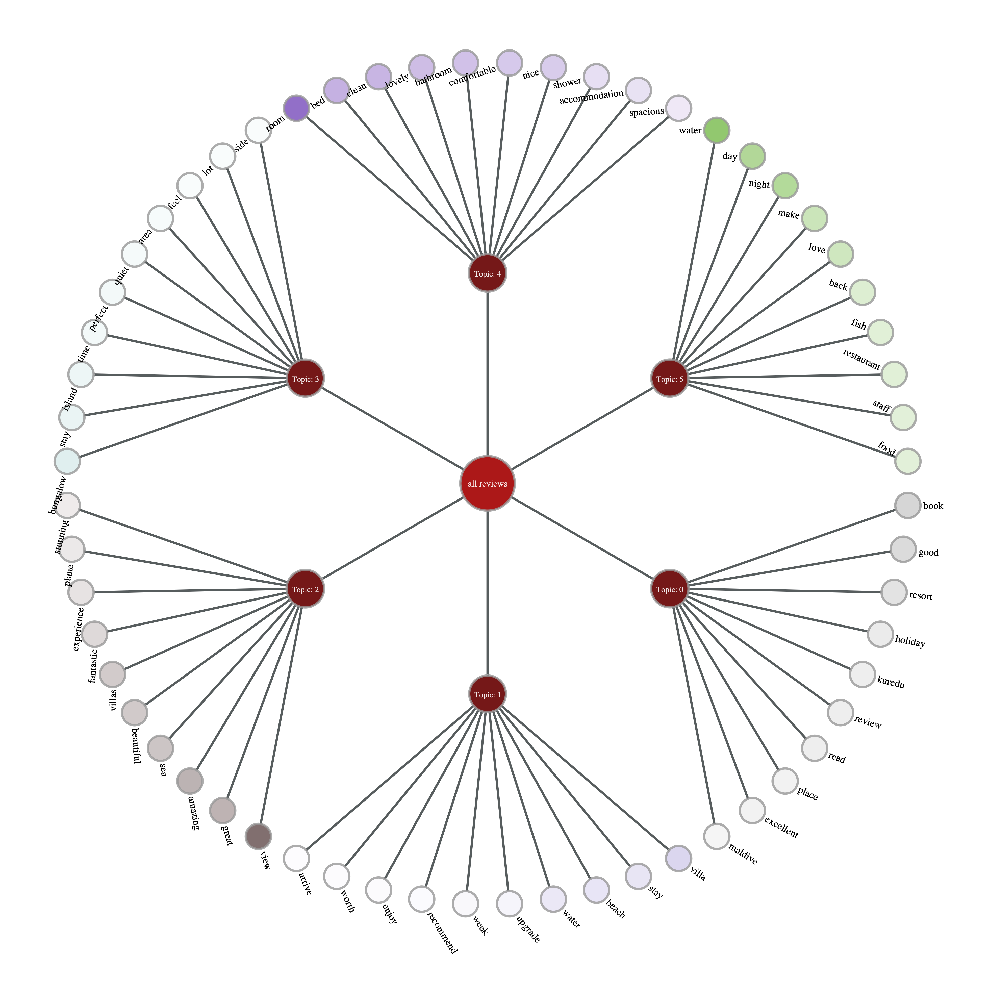

In [68]:
from IPython.display import Image 

Image("room_vis.png")

## Location

In [69]:
location_df.head()

,ReviewNumber,Review,Rating
68,7,"We love the island and the warm weather, walking bare foot in the white soft sand and snorkling ...",0.9100
71,8,"The island has now become more defined into 3 resorts and when you choose your accommodation, yo...",0.4902
73,8,I had previously emailed customer services to ask not to be located if possible by the sand pump...,-0.1901
86,11,The room was good and good located close to the sea.,0.7003
91,14,The whole experience starting with arriving by seaplane to seeing our water villa was wonderful.,0.5719


In [70]:
location_df.shape

(3956, 3)

In [71]:
#mean rating overall
print('Average location rating:', location_df.Rating.mean())
print('Average location rating when transformed into the range 1-5: ', (location_df.Rating.mean()+1)*(5/2))

Average location rating: 0.5021709555106167
Average location rating when transformed into the range 1-5:  3.755427388776542


[Text(0.5, 0, '')]

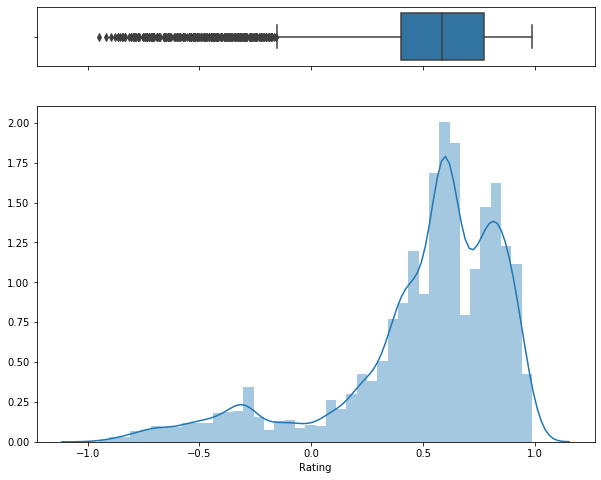

In [72]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(location_df["Rating"], ax=ax_box)
sns.distplot(location_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [73]:
loc_vals = location_df.Review.values

corpus_loc, data_lemmatized_loc, texts_loc, id2word_loc = data_prep(loc_vals)

#### Topic modelling

In [74]:
K = 4

gensim_lda_loc = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_loc,
                                                    num_topics=K,
                                                    id2word=id2word_loc,
                                                    iterations=1000,
                                                    random_seed=1234)

In [75]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_loc.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('walk', 0.07453805198872533),
   ('island', 0.07015346069527091),
   ('beautiful', 0.05277168806764798),
   ('time', 0.026620732853116193),
   ('view', 0.023175696836830566),
   ('kuredu', 0.022862511744440966),
   ('feel', 0.019104290635765738),
   ('wonderful', 0.017068587535233323),
   ('place', 0.01659880989664892),
   ('make', 0.015815847165674912),
   ('people', 0.015659254619480114),
   ('enjoy', 0.014719699342311305),
   ('lot', 0.014406514249921704),
   ('staff', 0.013623551518947698),
   ('step', 0.013153773880363295),
   ('fish', 0.012997181334168493),
   ('relax', 0.012840588787973693),
   ('small', 0.011744440964610085),
   ('spend', 0.011744440964610085),
   ('special', 0.010178515502662073),
   ('turtle', 0.009552145317882869),
   ('land', 0.009552145317882869),
   ('shark', 0.009395552771688067),
   ('give', 0.009082367679298466),
   ('evening', 0.008769182586908864),
   ('big', 0.008142812402129659),
   ('site', 0.007203257124960852),
   ('morning', 0.00689007

In [76]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_loc = format_topics_sentences(gensim_lda_loc, corpus_loc, data_lemmatized_loc)

#format
df_dominant_topic_loc = df_topic_sents_keywords_loc.reset_index()
df_dominant_topic_loc.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_loc.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.3342,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[warm, weather, walk, white, soft, sand, snorkle, clear, warm, turquoise, water, hope, back, day]"
1,1,1.0,0.2609,"seaplane, resort, day, experience, holiday, male, airport, fantastic, love, hour","[become, define, resort, choose, accommodation, know, exactly, locate, island, much, better]"
2,2,2.0,0.3008,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[previously, email, customer, service, ask, locate, possible, sand, pump, long, black, pipe, sit..."
3,3,2.0,0.2737,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[room, good, locate, close, sea]"
4,4,1.0,0.2895,"seaplane, resort, day, experience, holiday, male, airport, fantastic, love, hour","[whole, experience, start, arrive, seaplane, seeing, water, villa, wonderful]"
5,5,3.0,0.2736,"stay, restaurant, villa, location, bungalow, great, perfect, transfer, excellent, area","[enjoy, eat, restaurant]"
6,6,2.0,0.2788,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[really, nice, clean, really, well]"
7,7,0.0,0.2672,"walk, island, beautiful, time, view, kuredu, feel, wonderful, place, make","[island, quite, big, end, need, minute, foot, take, minute, nice, way, walk]"
8,8,2.0,0.2870,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[beach, world, food, amazing]"
9,9,3.0,0.3599,"stay, restaurant, villa, location, bungalow, great, perfect, transfer, excellent, area","[could, hand, pick, villa, would, perfect, location, away, main, area, total, relaxation, privat..."


In [77]:
#combine with raw review text, wort by topic and save
location_df.reset_index(drop=True, inplace=True)
df_dominant_topic_loc.reset_index(drop=True, inplace=True)

df_loc = pd.concat([df_dominant_topic_loc, location_df], axis=1)
df_loc = df_loc.sort_values(by=['Dominant_Topic'])

#save
df_loc.to_csv(r'data/df_location_topics.csv', index = False)

In [78]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_loc = pd.DataFrame()
sent_topics_outdf_grpd_loc = df_topic_sents_keywords_loc.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_loc:
    sent_topics_sorteddf_loc = pd.concat([sent_topics_sorteddf_loc, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_loc.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_loc.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_loc.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.3717,"walk, island, beautiful, time, view, kuredu, feel, wonderful, place, make","[surround, view, would, walk, island, morning, pre, brekkie, breathtaking, would, see, huge, sho..."
1,1.0,0.4164,"seaplane, resort, day, experience, holiday, male, airport, fantastic, love, hour","[partner, get, bit, dodgy, start, connect, flight, hour, late, therefore, go, one, leave, behind..."
2,2.0,0.3689,"beach, good, water, amazing, room, sea, lovely, nice, sand, clean","[course, change, load, better, lovely, white, soft, sand, sea, amazing, turquoise, colour, warm]"
3,3.0,0.3677,"stay, restaurant, villa, location, bungalow, great, perfect, transfer, excellent, area","[even, mini, crack, driver, thing, go, restaurant, pool, area, guy, refuse, entry, say, would, g..."


In [79]:
sent_topics_sorteddf_loc.to_csv(r'data/sent_topics_sorteddf_loc.csv', index = False)

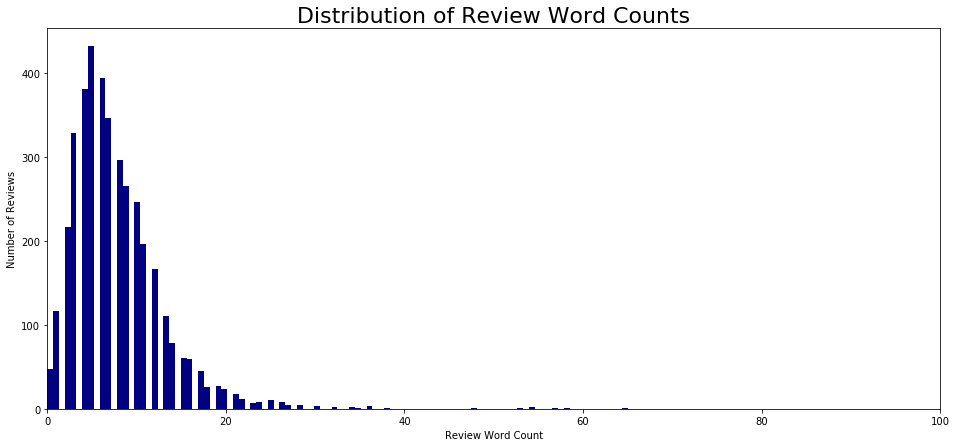

In [80]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_loc)

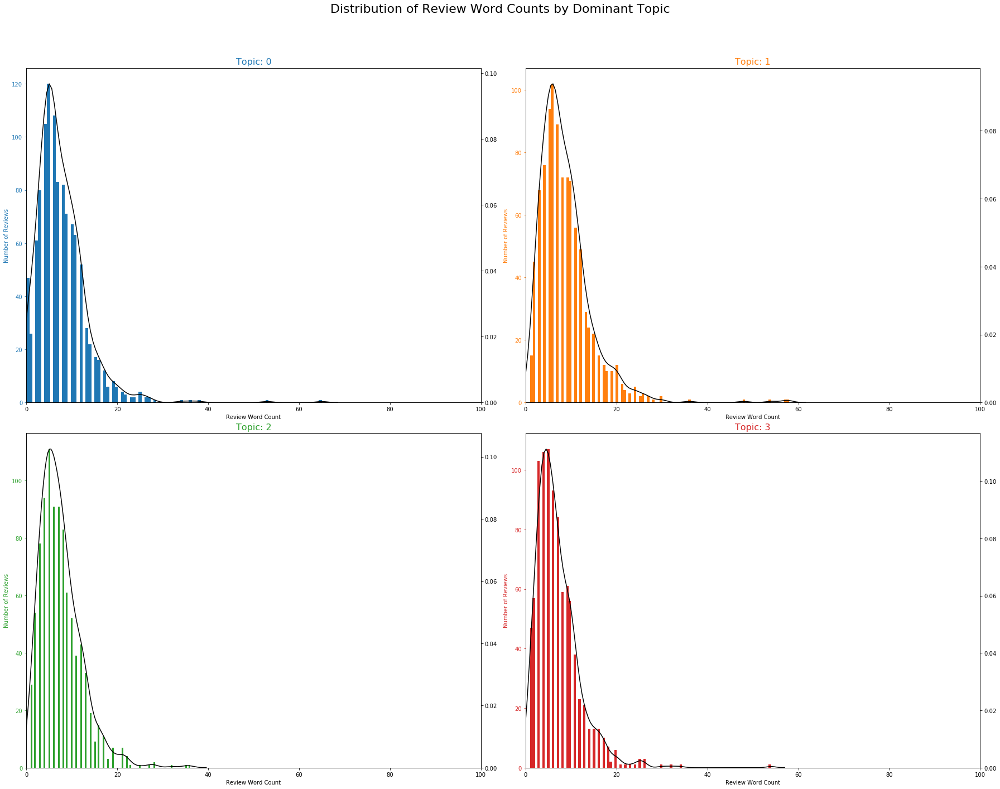

In [81]:
plot_dist_word_count_topic(2, 2, df_dominant_topic_loc)

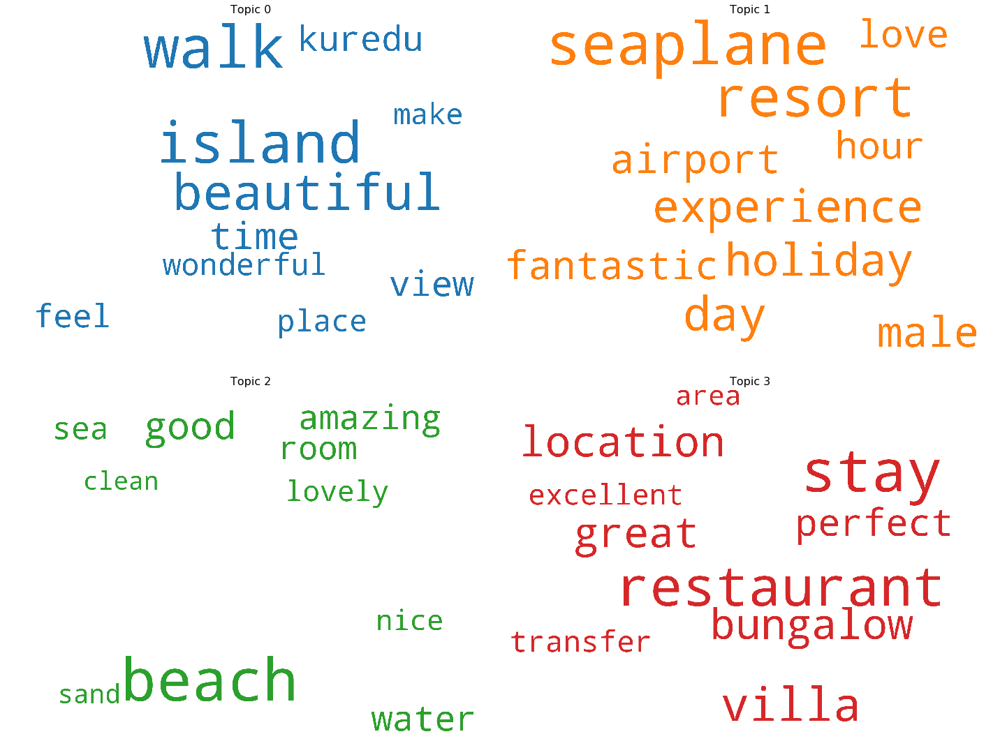

In [82]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_loc, 2, 2)

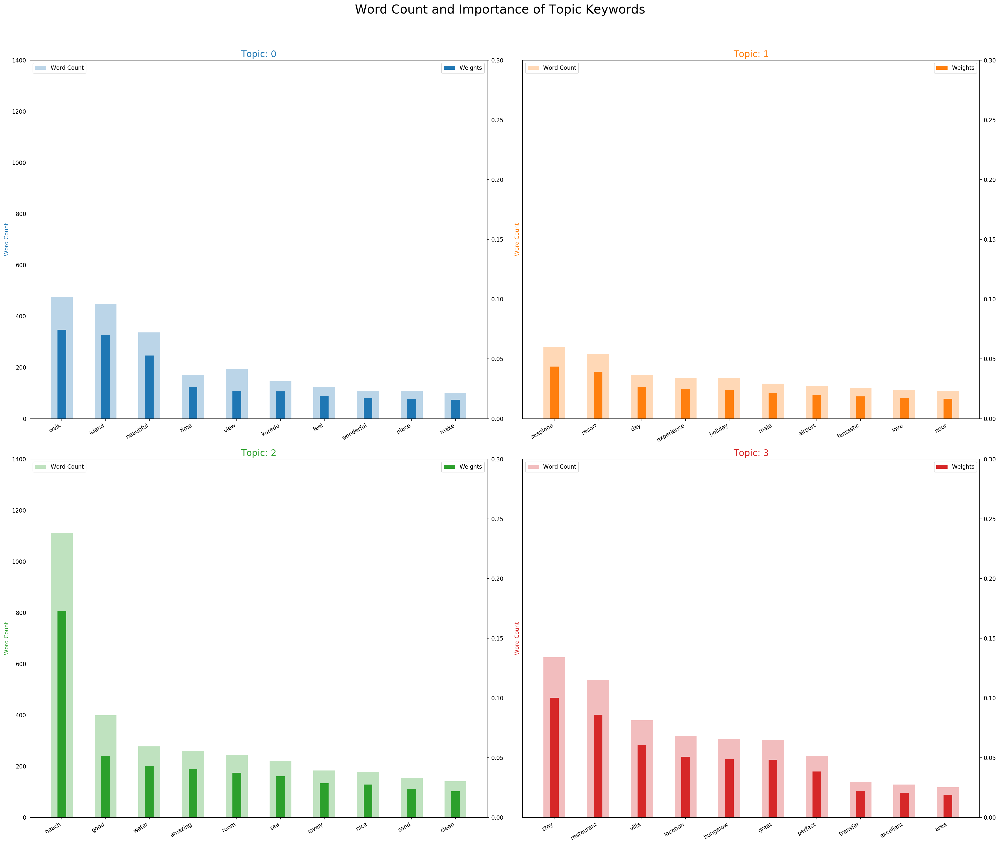

In [83]:
#Word counts of topic keywords
word_count_plot(gensim_lda_loc, data_lemmatized_loc, 2, 2, 0.30, 1400)

In [84]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_loc, corpus_loc, K)

Loading BokehJS ...

In [85]:
#pyLDAVis
import pyLDAvis.gensim

model2_loc = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_loc)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_loc, corpus_loc, dictionary=id2word_loc)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.233419 -0.078557       1        1  25.247678
0     -0.113273 -0.356033       2        1  25.161188
2      0.221384  0.224605       3        1  24.931245
3     -0.341530  0.209986       4        1  24.659888, topic_info=           Term         Freq        Total Category  logprob  loglift
25        beach  1313.000000  1313.000000  Default  30.0000  30.0000
138        stay   753.000000   753.000000  Default  29.0000  29.0000
56   restaurant   646.000000   646.000000  Default  28.0000  28.0000
8          walk   572.000000   572.000000  Default  27.0000  27.0000
19       island   538.000000   538.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
318    distance    32.507473    32.507473   Topic4  -5.4440   1.4000
145      return    57.791062    58.971079   Topic4  -4.8687   1.3798
412    gorgeous    49.363199    50.564916   Topic4  -5.0263   1.3759
496       offer    49.363199    50.564916   Topic4  -5.0263   1.3759
92     stunning    68.626886   100.834540   Topic4  -4.6968   1.0152

[287 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
416       2  0.951020       absolute
341       4  0.996694     absolutely
13        3  1.003554  accommodation
538       3  0.996995       activity
1320      4  0.830578             ad
...     ...       ...            ...
53        2  1.000098      wonderful
71        2  0.989575          world
699       3  0.994827          worth
1317      4  0.830578      wristband
146       4  0.996694           year

[281 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3, 4])

In [86]:
pyLDAvis.save_html(vis, 'location_vis_pyldavis.html')

In [87]:
loc_vis = Visualization()

for i, item in enumerate(gensim_lda_loc.show_topics(num_topics=8, num_words=10, formatted=False)):
    vtopic = loc_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        loc_vis.add_term(vtopic, term, weight=weight / maxWeight)

loc_vis.draw("location_vis.png")

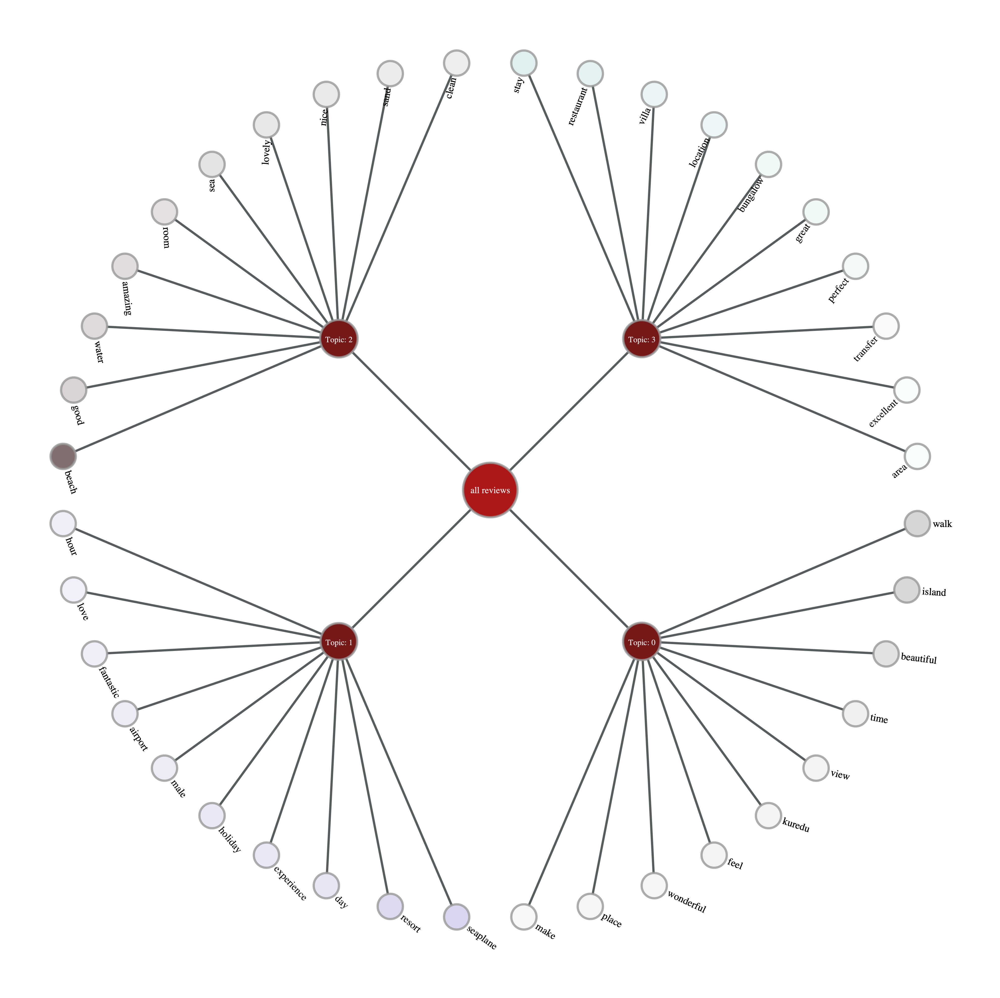

In [88]:
Image("location_vis.png")

## Cleanliness


In [89]:
cleanliness_df.head()

,ReviewNumber,Review,Rating
14,1,Our villa was spotless and just what you need to relax.,0.4404
44,4,"Ibrahim kept our villa spotless every day and night, clean towels and bed linen regularly changed.",0.4019
121,21,Very reasonable and staff that cant help enough.,-0.3089
220,45,our chap that looked after cleaning our room Zareer ( sorry if spelt incorrectly) such a hard wo...,0.0772
281,57,"a fantastic island, sandy, clean beaches and clear water.",0.8360


In [90]:
cleanliness_df.shape

(928, 3)

In [91]:
#mean rating overall
print('Average cleanliness rating:', cleanliness_df.Rating.mean())
print('Average cleanliness rating when transformed into the range 1-5: ', (cleanliness_df.Rating.mean()+1)*(5/2))

Average cleanliness rating: 0.577328771551725
Average cleanliness rating when transformed into the range 1-5:  3.9433219288793127


[Text(0.5, 0, '')]

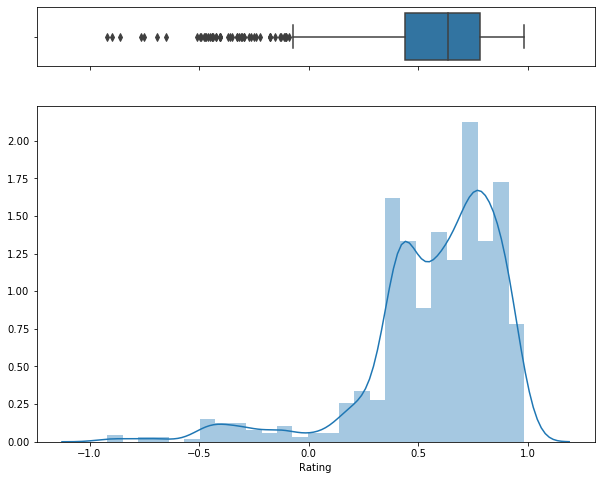

In [92]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(cleanliness_df["Rating"], ax=ax_box)
sns.distplot(cleanliness_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [93]:
clean_vals = cleanliness_df.Review.values

corpus_clean, data_lemmatized_clean, texts_clean, id2word_clean = data_prep(clean_vals)

#### Topic modelling

In [94]:
K = 3

gensim_lda_clean = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_clean,
                                                    num_topics=K,
                                                    id2word=id2word_clean,
                                                    iterations=1000,
                                                    random_seed=1)

In [95]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_clean.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('room', 0.18646012621916236),
   ('clean', 0.14285714285714285),
   ('day', 0.0717154331612163),
   ('boy', 0.03098106712564544),
   ('tidy', 0.02983362019506598),
   ('lovely', 0.024096385542168676),
   ('amazing', 0.020654044750430294),
   ('nice', 0.019506597819850834),
   ('job', 0.013769363166953529),
   ('leave', 0.013195639701663799),
   ('cleaner', 0.012048192771084338),
   ('view', 0.010900745840504877),
   ('place', 0.010327022375215147),
   ('fantastic', 0.010327022375215147),
   ('back', 0.009179575444635685),
   ('lady', 0.0068846815834767644),
   ('perfectly', 0.0068846815834767644),
   ('accomodation', 0.006310958118187034),
   ('cleaning', 0.006310958118187034),
   ('thing', 0.005737234652897304),
   ('life', 0.005737234652897304),
   ('pool', 0.005737234652897304),
   ('spacious', 0.004589787722317842),
   ('long', 0.004589787722317842),
   ('bed', 0.004589787722317842),
   ('guy', 0.004589787722317842),
   ('top', 0.004016064257028112),
   ('expect', 0.004016

In [96]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_clean = format_topics_sentences(gensim_lda_clean, corpus_clean, data_lemmatized_clean)

#format
df_dominant_topic_clean = df_topic_sents_keywords_clean.reset_index()
df_dominant_topic_clean.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_clean.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,1.0,0.3560,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[villa, spotless, nee, relax]"
1,1,2.0,0.3653,"clean, resort, water, good, spotlessly, great, time, food, accommodation, comfortable","[keep, spotless, day, night, clean, towel, bed, linen, regularly, change]"
2,2,1.0,0.3590,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[reasonable, staff, can, help, enough]"
3,3,1.0,0.3620,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[look, clean, room, zareer, sorry, incorrectly, hard, worker, heart, go, push, certainly, look, ..."
4,4,1.0,0.3591,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[island, sandy, clean, beach, clear, water]"
5,5,1.0,0.3467,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[still, stay, excellent, service, clean, general, staff, cleaning, time]"
6,6,1.0,0.3396,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[spotlessly, clean, look, ahusan]"
7,7,1.0,0.3416,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[bare, foot, even, island, shoe]"
8,8,1.0,0.3396,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[maintain, spotlessly, clean, need]"
9,9,0.0,0.3532,"room, clean, day, boy, tidy, lovely, amazing, nice, job, leave","[island, keep, clean, lady, continually, seep, leave]"


In [97]:
#combine with raw review text, wort by topic and save
cleanliness_df.reset_index(drop=True, inplace=True)
df_dominant_topic_clean.reset_index(drop=True, inplace=True)

df_clean = pd.concat([df_dominant_topic_clean, cleanliness_df], axis=1)
df_clean = df_clean.sort_values(by=['Dominant_Topic'])

#save
df_clean.to_csv(r'data/df_cleanliness_topics.csv', index = False)

In [98]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_clean = pd.DataFrame()
sent_topics_outdf_grpd_clean = df_topic_sents_keywords_clean.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_clean:
    sent_topics_sorteddf_clean = pd.concat([sent_topics_sorteddf_clean, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_clean.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_clean.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_clean.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.4074,"room, clean, day, boy, tidy, lovely, amazing, nice, job, leave","[room, room, stun, extremely, clean, lovely, flower, arrangement, bed, honeymoon]"
1,1.0,0.3977,"clean, island, maintain, beach, beautiful, staff, stay, spotless, perfect, excellent","[beautiful, sandy, clean, beach, many, activity, wish, stay, longer, try]"
2,2.0,0.4364,"clean, resort, water, good, spotlessly, great, time, food, accommodation, comfortable","[sea, lot, marine, life, even, sadly, lot, coral, bleach, dead, resort, fault, obviously, kuredu..."


In [99]:
sent_topics_sorteddf_clean.to_csv(r'data/sent_topics_sorteddf_clean.csv', index = False)

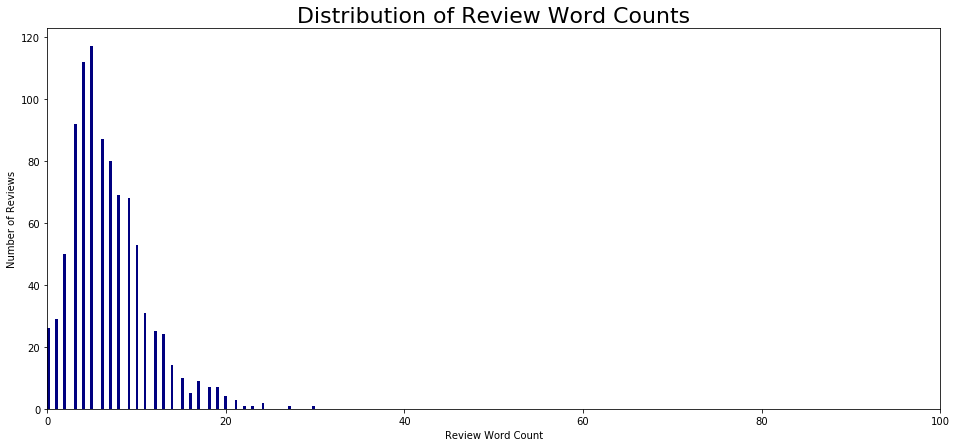

In [100]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_clean)

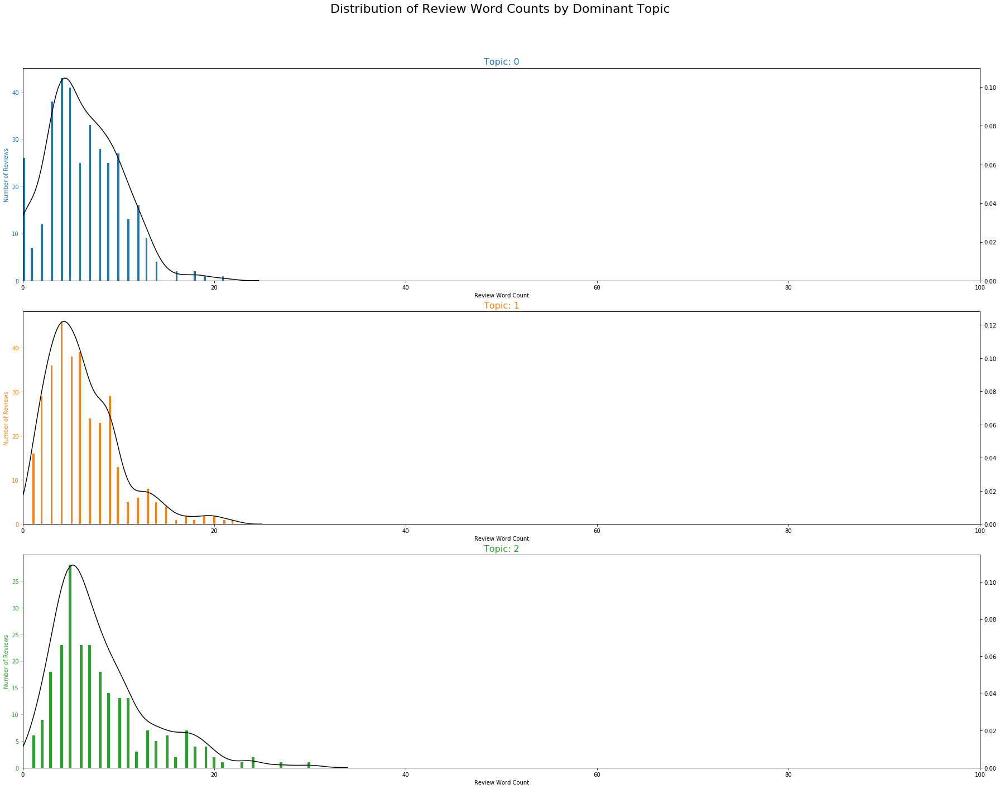

In [101]:
plot_dist_word_count_topic(3, 1, df_dominant_topic_clean)

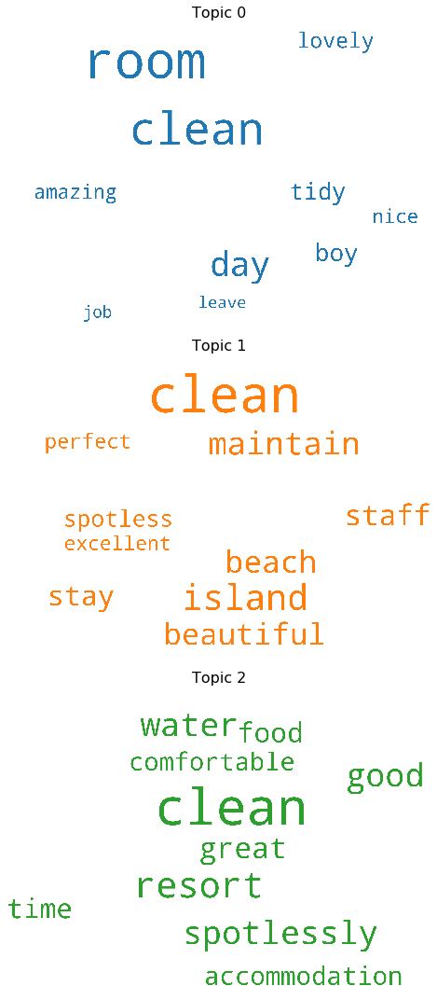

In [102]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_clean, 3, 1)

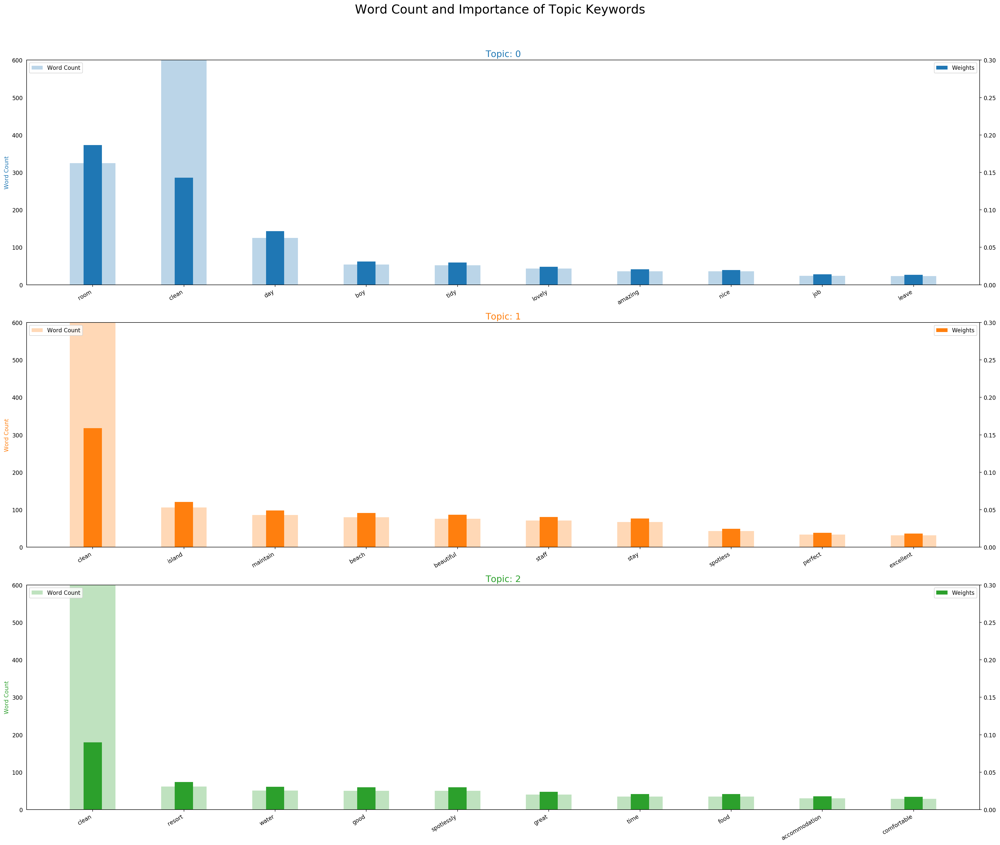

In [103]:
#Word counts of topic keywords
word_count_plot(gensim_lda_clean, data_lemmatized_clean, 3, 1, 0.30, 600)

In [104]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_clean, corpus_clean, K)

Loading BokehJS ...

In [105]:
#pyLDAVis
import pyLDAvis.gensim

model2_clean = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_clean)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_clean, corpus_clean, dictionary=id2word_clean)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.331642 -0.066213       1        1  33.468333
0      0.224324 -0.248405       2        1  33.315045
1      0.107318  0.314618       3        1  33.216622, topic_info=         Term        Freq       Total Category  logprob  loglift
26       room  391.000000  391.000000  Default  30.0000  30.0000
7         day  150.000000  150.000000  Default  29.0000  29.0000
34     island  126.000000  126.000000  Default  28.0000  28.0000
50   maintain  102.000000  102.000000  Default  27.0000  27.0000
32      beach   95.000000   95.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
715   quality    7.143937    7.143937   Topic3  -5.6796   1.1021
161  bungalow   34.529028   37.036864   Topic3  -4.1041   1.0320
29       work   28.575748   31.083583   Topic3  -4.2933   1.0180
3       villa   32.147716   35.909469   Topic3  -4.1755   0.9915
6       clean  332.193067  821.274853   Topic3  -1.8402   0.1970

[195 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
106       1  1.010167  accommodation
151       2  0.981759   accomodation
395       2  0.969173       adequate
809       3  1.119831            air
57        2  0.992248        amazing
...     ...       ...            ...
485       2  0.830719     wonderfull
29        1  0.096514           work
29        3  0.932968           work
770       3  1.119831        working
310       3  0.959855           year

[175 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2])

In [106]:
pyLDAvis.save_html(vis, 'cleanliness_vis_pyldavis.html')

In [107]:
clean_vis = Visualization()

for i, item in enumerate(gensim_lda_clean.show_topics(num_topics=3, num_words=10, formatted=False)):
    vtopic = clean_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        clean_vis.add_term(vtopic, term, weight=weight / maxWeight)

clean_vis.draw("cleanliness_vis.png")

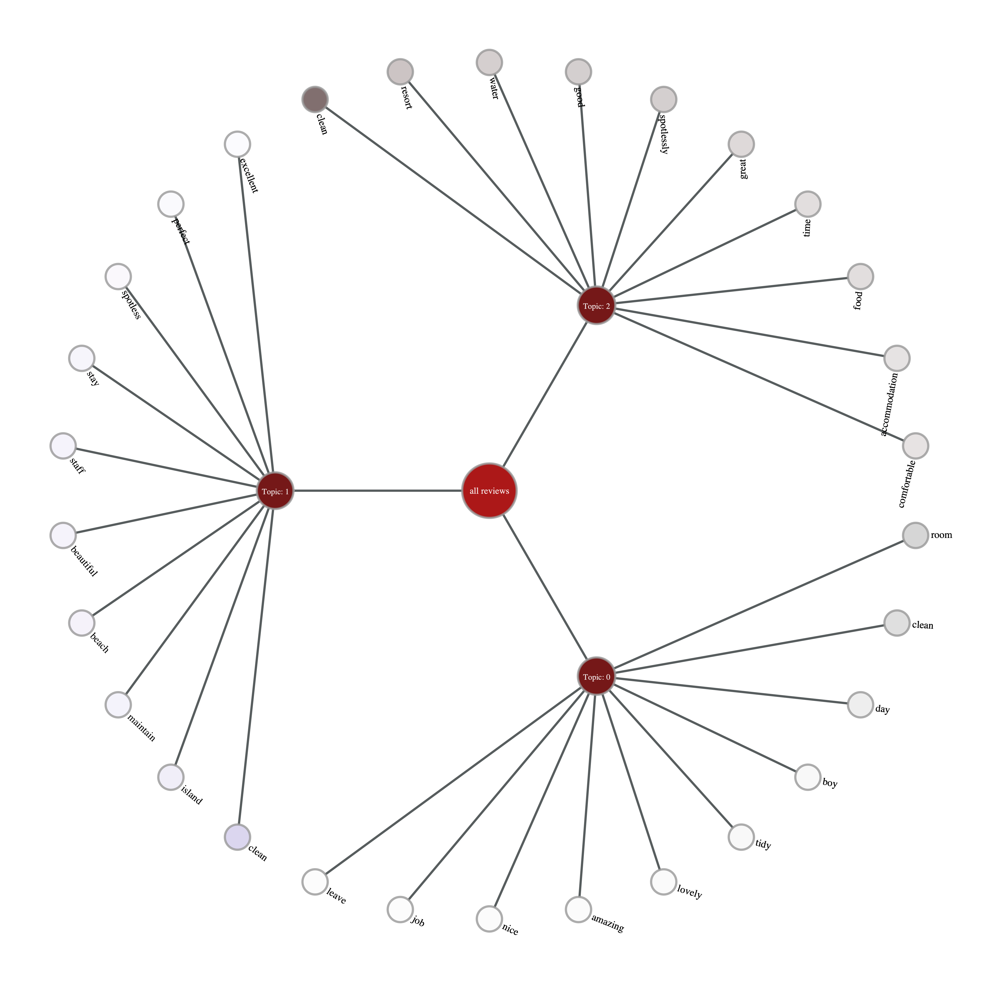

In [108]:
Image("cleanliness_vis.png")

## Service

In [109]:
service_df.head()

,ReviewNumber,Review,Rating
2,0,"All members of the staff at Kuredu from wait staff, to check in staff to retail associates were ...",0.4754
3,0,Our dining room waiter - Shaleef (spelling is probably wrong) and Manju the bartender took good...,0.7269
9,1,We were greeted by members of staff plying the drums and clapping us in.,0.2732
10,1,Our reception was fantastic and we went straight for lunch before we went to our villa where our...,0.6705
11,1,"Everything about this holiday was superb , the villa, the staff, the service along with the loca...",0.8034


In [110]:
service_df.shape

(13748, 3)

In [111]:
#mean rating overall
print('Average service rating:', service_df.Rating.mean())
print('Average service rating when transformed into the range 1-5: ', (service_df.Rating.mean()+1)*(5/2))

Average service rating: 0.5654084739598528
Average service rating when transformed into the range 1-5:  3.913521184899632


[Text(0.5, 0, '')]

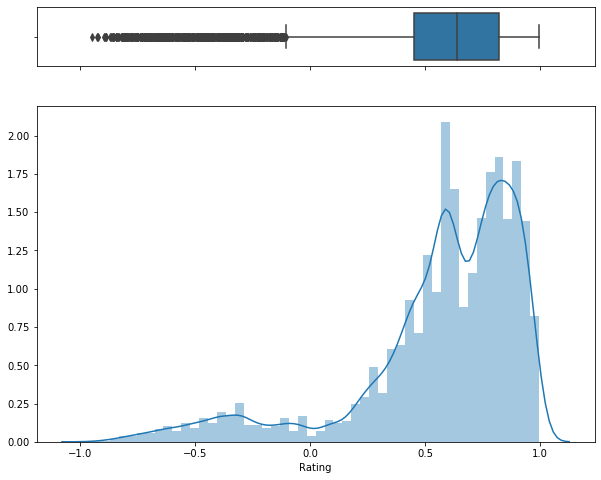

In [112]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(service_df["Rating"], ax=ax_box)
sns.distplot(service_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [113]:
service_vals = service_df.Review.values

corpus_service, data_lemmatized_service, texts_service, id2word_service = data_prep(service_vals)

#### Topic modelling

In [114]:
K = 8

gensim_lda_service = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_service,
                                                    num_topics=K,
                                                    id2word=id2word_service,
                                                    iterations=1000,
                                                    random_seed=1)

In [115]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_service.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('amazing', 0.08058102734723688),
   ('resort', 0.0480402499391382),
   ('fantastic', 0.04430739268035381),
   ('beautiful', 0.04106142984662826),
   ('beach', 0.037815467012902705),
   ('wonderful', 0.03594903838351051),
   ('place', 0.034163758824961456),
   ('perfect', 0.031323541345451594),
   ('experience', 0.031161243203765315),
   ('lovely', 0.03099894506207904),
   ('villa', 0.029375963645216264),
   ('brilliant', 0.018826584435608213),
   ('service', 0.018583137223078795),
   ('view', 0.017852795585490546),
   ('accommodation', 0.017852795585490546),
   ('staff', 0.017690497443804267),
   ('sea', 0.015093727176823826),
   ('fabulous', 0.012091211555627687),
   ('bungalow', 0.011847764343098272),
   ('weather', 0.011604317130568855),
   ('top', 0.010224782926235495),
   ('outstanding', 0.009413292217804107),
   ('fault', 0.009413292217804107),
   ('delicious', 0.008845248721902134),
   ('stunning', 0.008277205226000162),
   ('manager', 0.008114907084313885),
   ('set', 

In [116]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_service = format_topics_sentences(gensim_lda_service, corpus_service, data_lemmatized_service)

#format
df_dominant_topic_service = df_topic_sents_keywords_service.reset_index()
df_dominant_topic_service.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_service.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.1856,"staff, friendly, helpful, waiter, clean, smile, mention, attentive, extremely, member","[member, staff, kuredu, wait, staff, check, staff, retail, associate, helpful]"
1,1,3.0,0.1718,"staff, friendly, helpful, waiter, clean, smile, mention, attentive, extremely, member","[dining, room, waiter, shaleef, spelling, probably, wrong, manju, take, good, care]"
2,2,1.0,0.1652,"make, holiday, kuredu, special, feel, give, greet, reception, guest, trip","[greeted, member, staff, plying, drum, clap]"
3,3,6.0,0.1682,"room, arrive, wait, flight, hour, check, seaplane, male, transfer, lounge","[go, straight, lunch, go, villa, case, wait]"
4,4,4.0,0.1507,"food, great, good, excellent, service, night, variety, quality, facility, buffet","[holiday, staff, service, location]"
5,5,3.0,0.1576,"staff, friendly, helpful, waiter, clean, smile, mention, attentive, extremely, member","[special, mention, go, sanjay, spelling, wrong, staff, credit, island]"
6,6,0.0,0.1379,"amazing, resort, fantastic, beautiful, beach, wonderful, place, perfect, experience, lovely","[tremendous, service, chef, waiter, perfect]"
7,7,1.0,0.1528,"make, holiday, kuredu, special, feel, give, greet, reception, guest, trip","[thank, enough, staff, involve, make, holiday, best, ever]"
8,8,3.0,0.1500,"staff, friendly, helpful, waiter, clean, smile, mention, attentive, extremely, member","[gorgeous, ground, staff, wonderful, island]"
9,9,2.0,0.1343,"food, day, restaurant, nice, choice, meal, eat, lot, find, lovely","[put, lockdown, corona, virus]"


In [117]:
#combine with raw review text, wort by topic and save
service_df.reset_index(drop=True, inplace=True)
df_dominant_topic_service.reset_index(drop=True, inplace=True)

df_service = pd.concat([df_dominant_topic_service, service_df], axis=1)
df_service = df_service.sort_values(by=['Dominant_Topic'])

#save
df_service.to_csv(r'data/df_service_topics.csv', index = False)

In [118]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_service = pd.DataFrame()
sent_topics_outdf_grpd_service = df_topic_sents_keywords_service.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_service:
    sent_topics_sorteddf_service = pd.concat([sent_topics_sorteddf_service, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_service.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_service.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_service.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.2614,"amazing, resort, fantastic, beautiful, beach, wonderful, place, perfect, experience, lovely","[place, beautiful, amazing, underwater, life, pristine, beach, beautiful, room, friendly, staff,..."
1,1.0,0.2857,"make, holiday, kuredu, special, feel, give, greet, reception, guest, trip","[holiday, wedding, work, closely, kuredu, team, plan, host, dream, wedding, week, festivity, gue..."
2,2.0,0.2979,"food, day, restaurant, nice, choice, meal, eat, lot, find, lovely","[huge, choice, food, offer, particularly, enjoy, watch, chef, prepare, fish, cook, salad, fresh,..."
3,3.0,0.2414,"staff, friendly, helpful, waiter, clean, smile, mention, attentive, extremely, member","[would, like, compliment, staff, include, lady, sweeper, friendly, way, build, crew, always, wav..."
4,4.0,0.2504,"food, great, good, excellent, service, night, variety, quality, facility, buffet","[great, time, food, excellent, different, country, theme, night, service, excellent, diving, wel..."
5,5.0,0.3279,"bar, restaurant, drink, inclusive, water, free, pool, area, main, include","[visit, stay, night, honestly, find, bad, inclusive, hotel, ever, visit, travel, inclusive, wide..."
6,6.0,0.3822,"room, arrive, wait, flight, hour, check, seaplane, male, transfer, lounge","[arrive, male, today, take, private, lounge, give, different, time, departure, leave, plane, unb..."
7,7.0,0.2974,"island, stay, time, book, leave, people, resort, back, visit, love","[visit, get, well, small, change, year, keep, comme, room, great, sleep, shower, s, need, want, ..."


In [119]:
sent_topics_sorteddf_service.to_csv(r'data/sent_topics_sorteddf_service.csv', index = False)

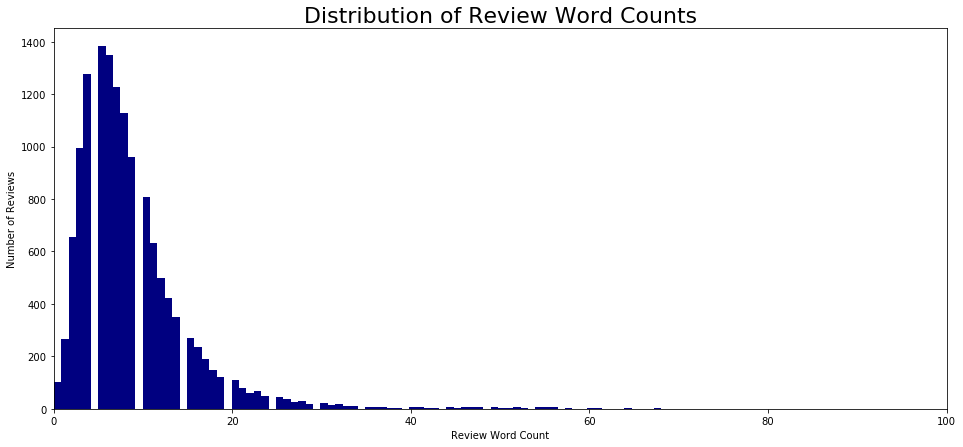

In [120]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_service)

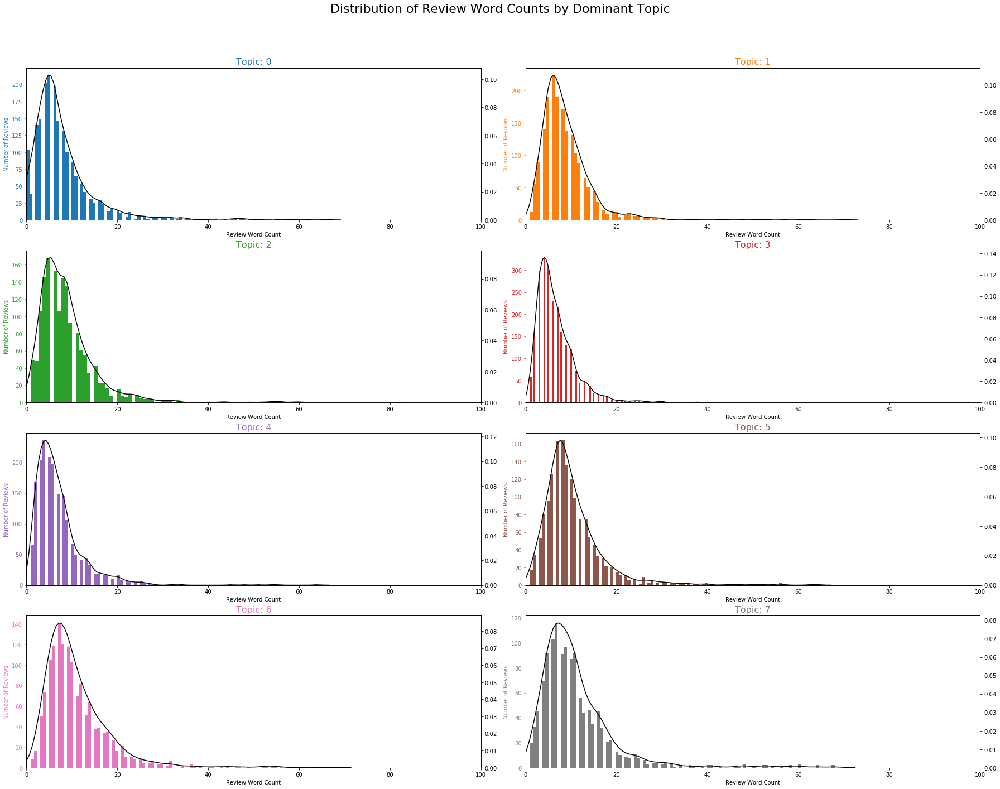

In [121]:
plot_dist_word_count_topic(4, 2, df_dominant_topic_service)

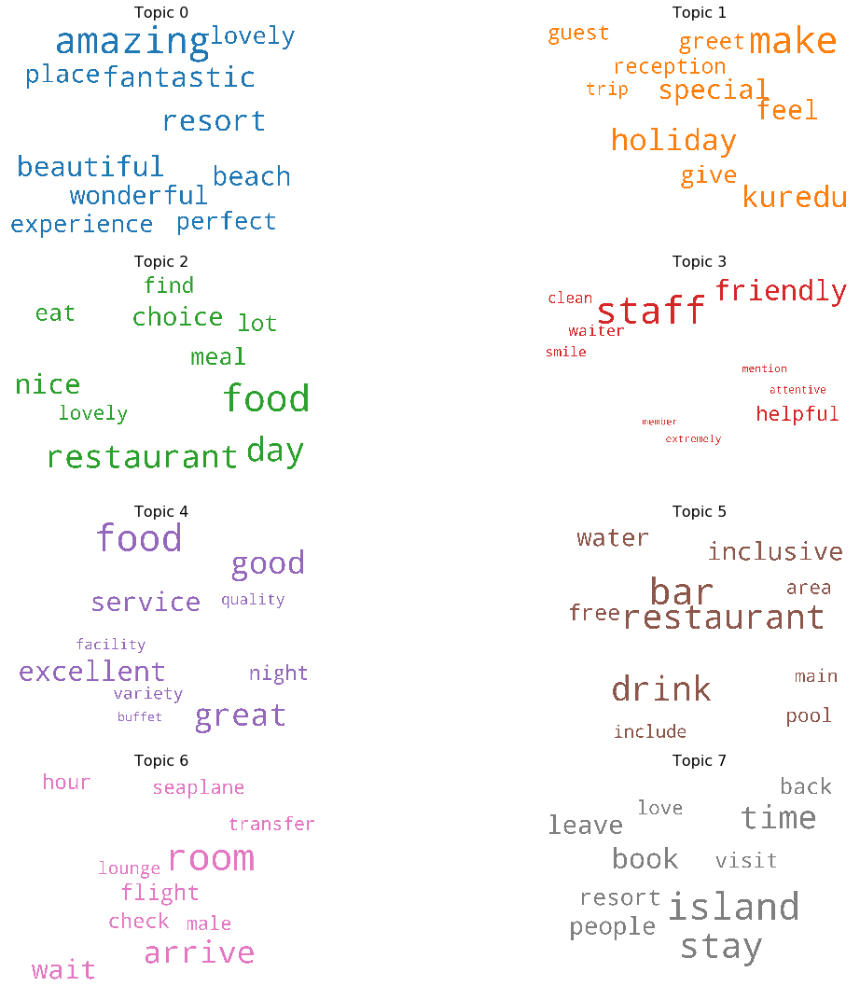

In [122]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_service, 4, 2)

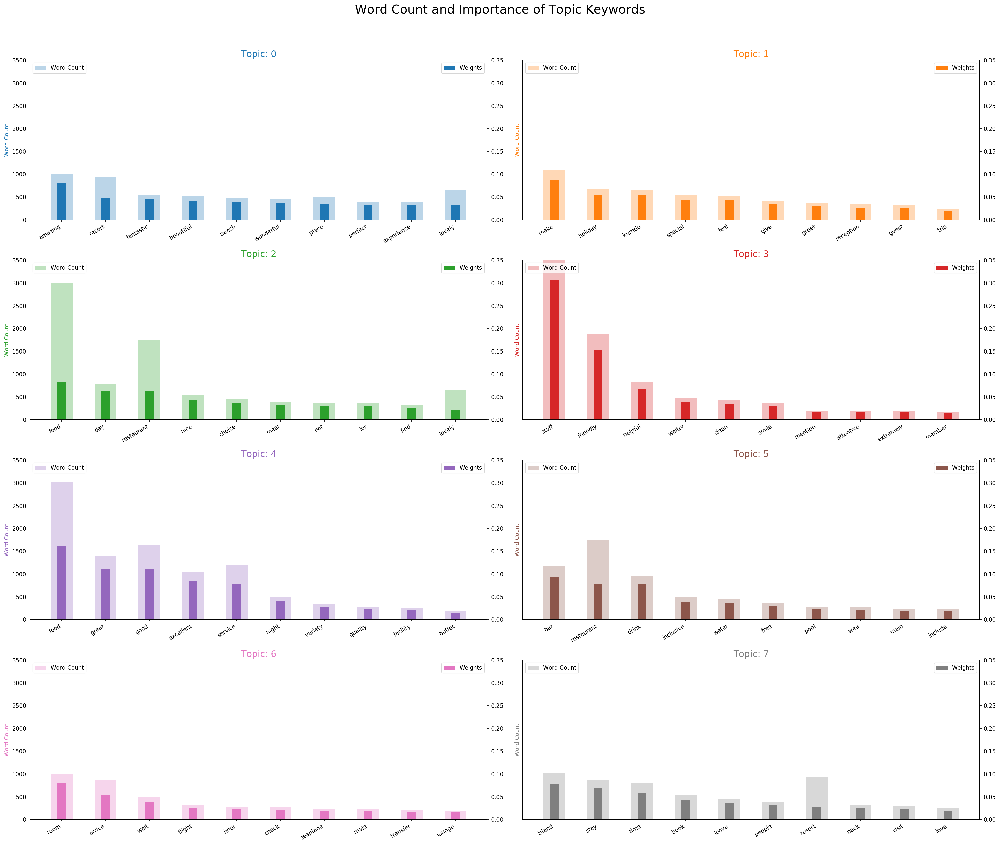

In [123]:
#Word counts of topic keywords
word_count_plot(gensim_lda_service, data_lemmatized_service, 4, 2, 0.35, 3500)

In [124]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_service, corpus_service, K)

Loading BokehJS ...

In [125]:
#pyLDAVis
import pyLDAvis.gensim

model2_service = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_service)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_service, corpus_service, dictionary=id2word_service)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.107484  0.066071       1        1  12.754077
6     -0.205117 -0.218802       2        1  12.659356
5      0.061227 -0.104696       3        1  12.617432
0     -0.026266  0.266231       4        1  12.530996
1     -0.194167 -0.193503       5        1  12.529016
2      0.296822 -0.069642       6        1  12.472963
4      0.295493 -0.025543       7        1  12.282313
3     -0.120508  0.279885       8        1  12.153846, topic_info=           Term         Freq        Total Category  logprob  loglift
6         staff  4720.000000  4720.000000  Default  30.0000  30.0000
81         food  3595.000000  3595.000000  Default  29.0000  29.0000
156    friendly  2218.000000  2218.000000  Default  28.0000  28.0000
65        great  1640.000000  1640.000000  Default  27.0000  27.0000
10         good  1951.000000  1951.000000  Default  26.0000  26.0000
..          ...          ...          ...      ...      ...      ...
967       cater    43.486287    43.486287   Topic8  -5.8098   2.1075
111    maintain    39.960372    39.960372   Topic8  -5.8944   2.1075
6         staff  4455.581471  4720.156020   Topic8  -1.1804   2.0498
240  absolutely   145.737827   163.896502   Topic8  -4.6005   1.9901
9        dining    48.187507    50.608664   Topic8  -5.7072   2.0585

[556 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
2824      6  1.101402        abit
240       6  0.109825  absolutely
240       8  0.890806  absolutely
2212      3  0.994654   abundance
2464      4  0.823964   accesibla
...     ...       ...         ...
257       7  0.855191       world
1001      2  0.996953       worth
87        1  0.999655        year
2155      3  1.036098      yellow
1764      7  0.983461        zone

[593 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 7, 6, 1, 2, 3, 5, 4])

In [126]:
pyLDAvis.save_html(vis, 'service_vis_pyldavis.html')

In [127]:
service_vis = Visualization()

for i, item in enumerate(gensim_lda_service.show_topics(num_topics=8, num_words=10, formatted=False)):
    vtopic = service_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        service_vis.add_term(vtopic, term, weight=weight / maxWeight)

service_vis.draw("service_vis.png")

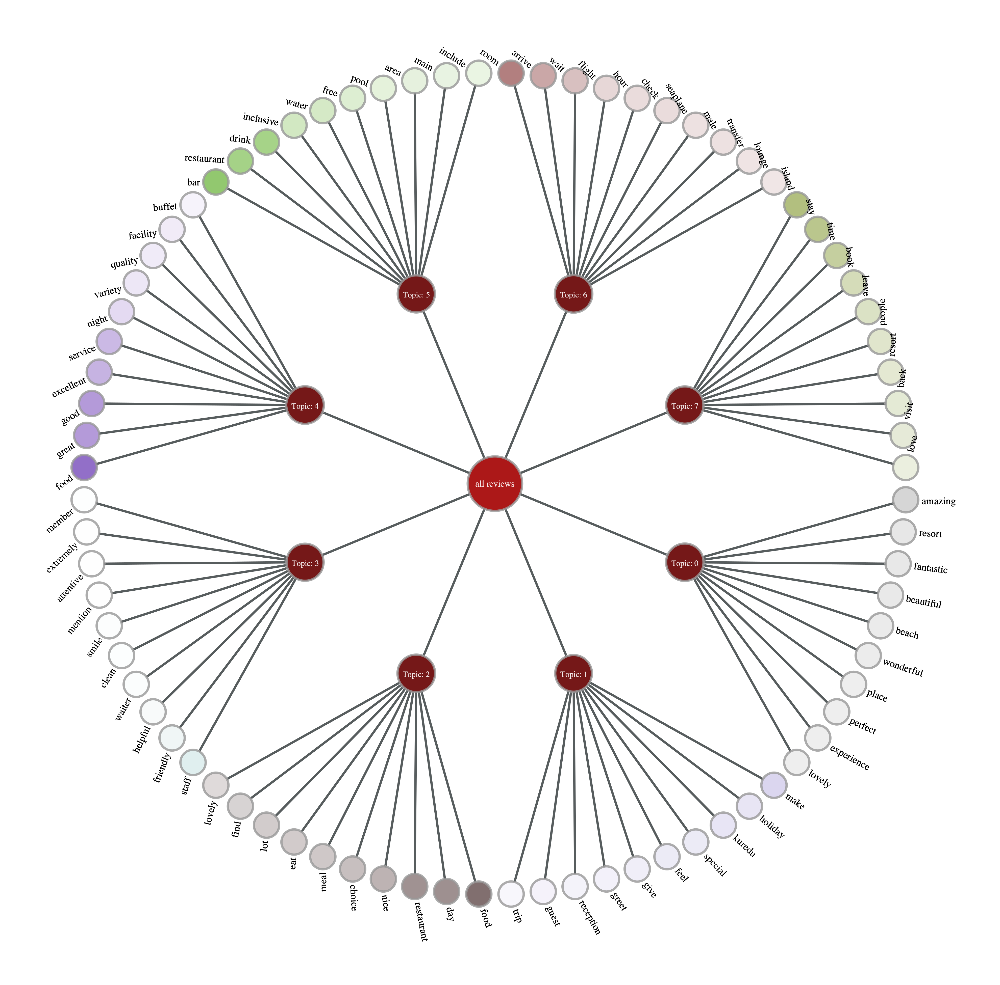

In [128]:
Image("service_vis.png")

## Facilities/Activities

In [129]:
facilities_df.head()

,ReviewNumber,Review,Rating
7,0,Thanks again to everyone for making this a great trip.,0.8305
15,1,"You can do as much or as little as like on the island but snorkelling with the Turtles, Stingray...",0.6138
22,2,"This curtailed all activities on the island, the blame is NOT that of the management team howeve...",0.0772
36,3,"The Pool attendant, Sobahan, looked after us impeccably for our 2 weeks, however we did miss Mir...",-0.2244
38,3,We saw him briefly at the main pool before we came home as he was on annual leave for a while.,-0.0516


In [130]:
facilities_df.shape

(3862, 3)

In [131]:
#mean rating overall
print('Average facilities/activities rating:', facilities_df.Rating.mean())
print('Average facilities/activities rating when transformed into the range 1-5: ', (facilities_df.Rating.mean()+1)*(5/2))

Average facilities/activities rating: 0.5199034179181751
Average facilities/activities rating when transformed into the range 1-5:  3.7997585447954374


[Text(0.5, 0, '')]

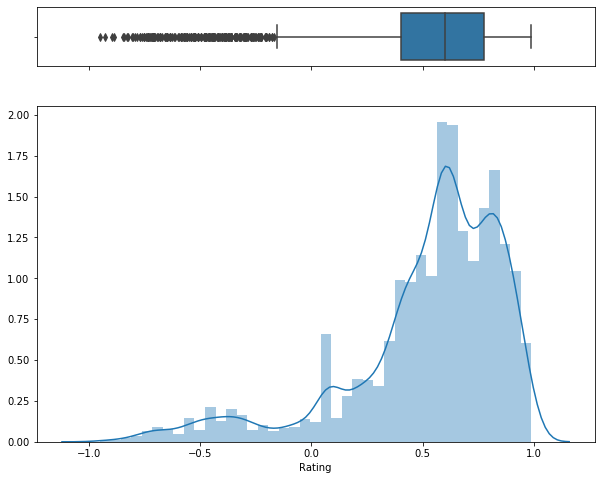

In [132]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(facilities_df["Rating"], ax=ax_box)
sns.distplot(facilities_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [133]:
fac_vals = facilities_df.Review.values

corpus_fac, data_lemmatized_fac, texts_fac, id2word_fac = data_prep(fac_vals)

#### Topic modelling

In [134]:
K = 6

gensim_lda_fac = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_fac,
                                                    num_topics=K,
                                                    id2word=id2word_fac,
                                                    iterations=1000,
                                                    random_seed=1234)

In [135]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_fac.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('snorkel', 0.08722466960352424),
   ('pool', 0.08458149779735682),
   ('water', 0.07863436123348018),
   ('swim', 0.048458149779735685),
   ('enjoy', 0.03590308370044053),
   ('sport', 0.03325991189427313),
   ('area', 0.02488986784140969),
   ('perfect', 0.024008810572687226),
   ('sea', 0.022026431718061675),
   ('golf', 0.019603524229074888),
   ('villa', 0.01828193832599119),
   ('side', 0.017180616740088105),
   ('bar', 0.016740088105726872),
   ('swimming', 0.01629955947136564),
   ('big', 0.013436123348017621),
   ('watch', 0.012114537444933921),
   ('part', 0.009911894273127754),
   ('kid', 0.009251101321585903),
   ('private', 0.008590308370044052),
   ('child', 0.00814977973568282),
   ('sit', 0.007929515418502203),
   ('tennis', 0.007488986784140969),
   ('clear', 0.007048458149779736),
   ('sand', 0.006607929515418502),
   ('busy', 0.006387665198237885),
   ('access', 0.005506607929515419),
   ('infinity', 0.005506607929515419),
   ('lot', 0.005506607929515419),
  

In [136]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_fac = format_topics_sentences(gensim_lda_fac, corpus_fac, data_lemmatized_fac)

#format
df_dominant_topic_fac = df_topic_sents_keywords_fac.reset_index()
df_dominant_topic_fac.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_fac.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,4.0,0.1950,"diving, great, dive, excellent, fantastic, experience, make, snorkelling, staff, love","[thank, make, great, trip]"
1,1,1.0,0.2429,"snorkelle, reef, turtle, fish, amazing, shark, ray, coral, snorkeling, life","[much, little, island, snorkelling, turtle, stingray, shark, stunning, fish, coral, sublime]"
2,2,3.0,0.1899,"good, activity, place, beach, beautiful, relax, night, lot, food, nice","[blame, management, team, however, put, holiday]"
3,3,2.0,0.1795,"trip, day, spa, holiday, excursion, wonderful, spend, lovely, massage, recommend","[look, impeccably, week, however]"
4,4,5.0,0.2024,"island, time, resort, stay, kuredu, maldive, trip, thing, find, visit","[see, briefly, main, pool, come, home, annual, leave]"
5,5,5.0,0.2350,"island, time, resort, stay, kuredu, maldive, trip, thing, find, visit","[joined, friend, visit, kuredu, first, time, fall, love, beautiful, island, snorkelle, first, time]"
6,6,1.0,0.2061,"snorkelle, reef, turtle, fish, amazing, shark, ray, coral, snorkeling, life","[incredible, variety, fish, simply, stunning]"
7,7,1.0,0.2556,"snorkelle, reef, turtle, fish, amazing, shark, ray, coral, snorkeling, life","[lucky, swim, huge, ray, shark, turtle, well, varied, fish, incredible, ocean]"
8,8,5.0,0.2025,"island, time, resort, stay, kuredu, maldive, trip, thing, find, visit","[trip, time, even, memorable, perhaps, due, fact, demonstrate, commitment, hotel, customer, well..."
9,9,0.0,0.1761,"snorkel, pool, water, swim, enjoy, sport, area, perfect, sea, golf","[plenty, keep, active, laze, around]"


In [137]:
#combine with raw review text, wort by topic and save
facilities_df.reset_index(drop=True, inplace=True)
df_dominant_topic_fac.reset_index(drop=True, inplace=True)

df_fac = pd.concat([df_dominant_topic_fac, facilities_df], axis=1)
df_fac = df_fac.sort_values(by=['Dominant_Topic'])

#save
df_fac.to_csv(r'data/df_facilities_topics.csv', index = False)

In [138]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_fac = pd.DataFrame()
sent_topics_outdf_grpd_fac = df_topic_sents_keywords_fac.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_fac:
    sent_topics_sorteddf_fac = pd.concat([sent_topics_sorteddf_fac, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_fac.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_fac.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_fac.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.3228,"snorkel, pool, water, swim, enjoy, sport, area, perfect, sea, golf","[swim, certain, swimming, pool, use, bar, drink, pool, ball, game, pool, kid, drink, free, bar]"
1,1.0,0.3384,"snorkelle, reef, turtle, fish, amazing, shark, ray, coral, snorkeling, life","[snorkeling, trip, reef, lagoon, never, fail, impress, shark, lion, eel, turtle, turtle, turtle,..."
2,2.0,0.3113,"trip, day, spa, holiday, excursion, wonderful, spend, lovely, massage, recommend","[start, save, next, trip, back, go, straight, wedding, reception, honeymoon, perhaps, could, bri..."
3,3.0,0.3279,"good, activity, place, beach, beautiful, relax, night, lot, food, nice","[say, years_ago, party, night, white, night, ever, pool, night, lot, drunk, people, strip, jump,..."
4,4.0,0.3167,"diving, great, dive, excellent, fantastic, experience, make, snorkelling, staff, love","[organise, well, equip, dive, company, use, padi, specialty, course, last, one, absolutely, bril..."
5,5.0,0.3295,"island, time, resort, stay, kuredu, maldive, trip, thing, find, visit","[trip, kuredu, complete, day, rather, rigid, schedule, friendly, travel, kuredu, give, insight, ..."


In [139]:
sent_topics_sorteddf_fac.to_csv(r'data/sent_topics_sorteddf_fac.csv', index = False)

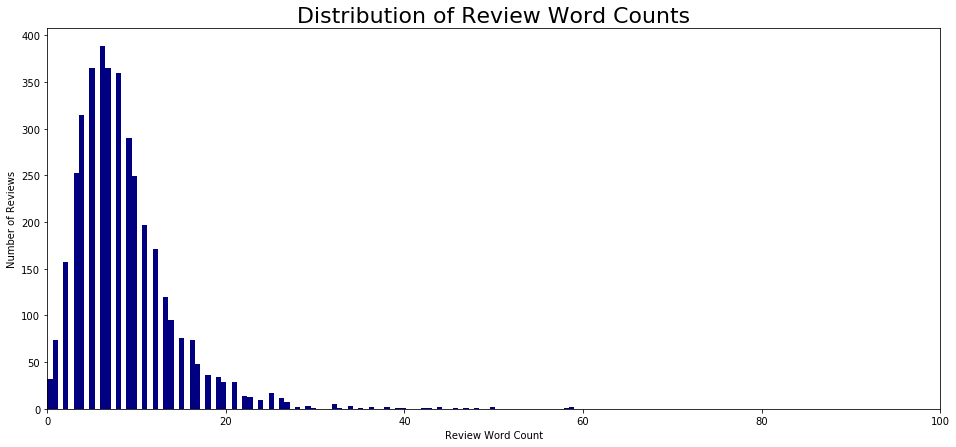

In [140]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_fac)

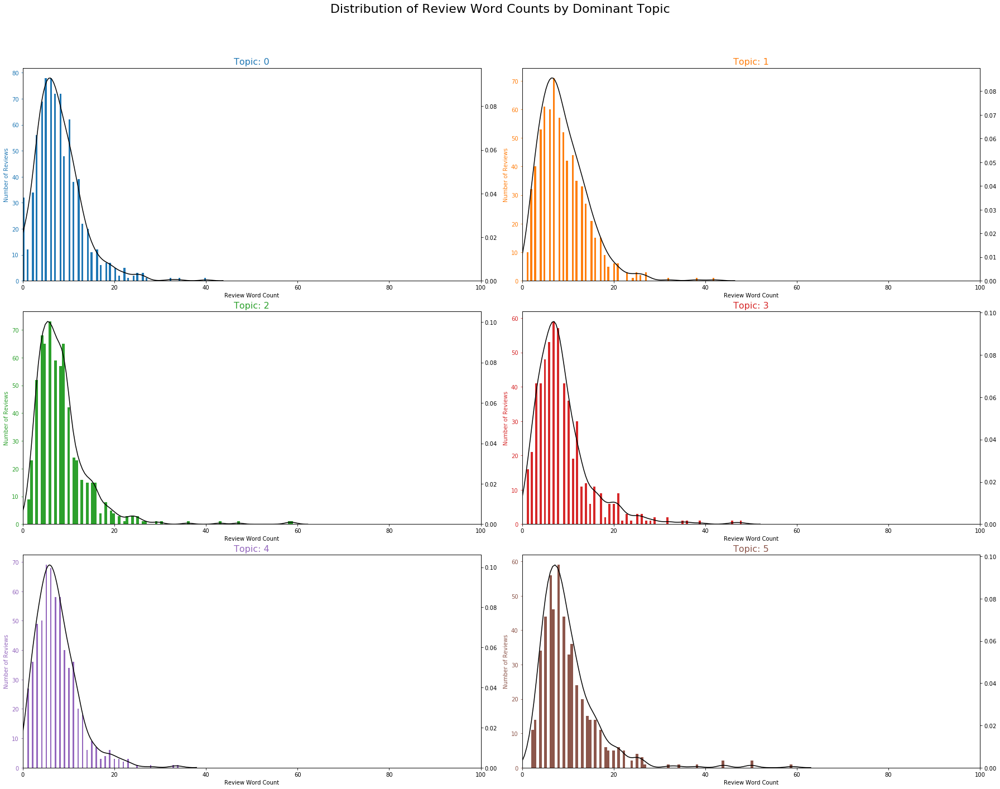

In [141]:
plot_dist_word_count_topic(3, 2, df_dominant_topic_fac)

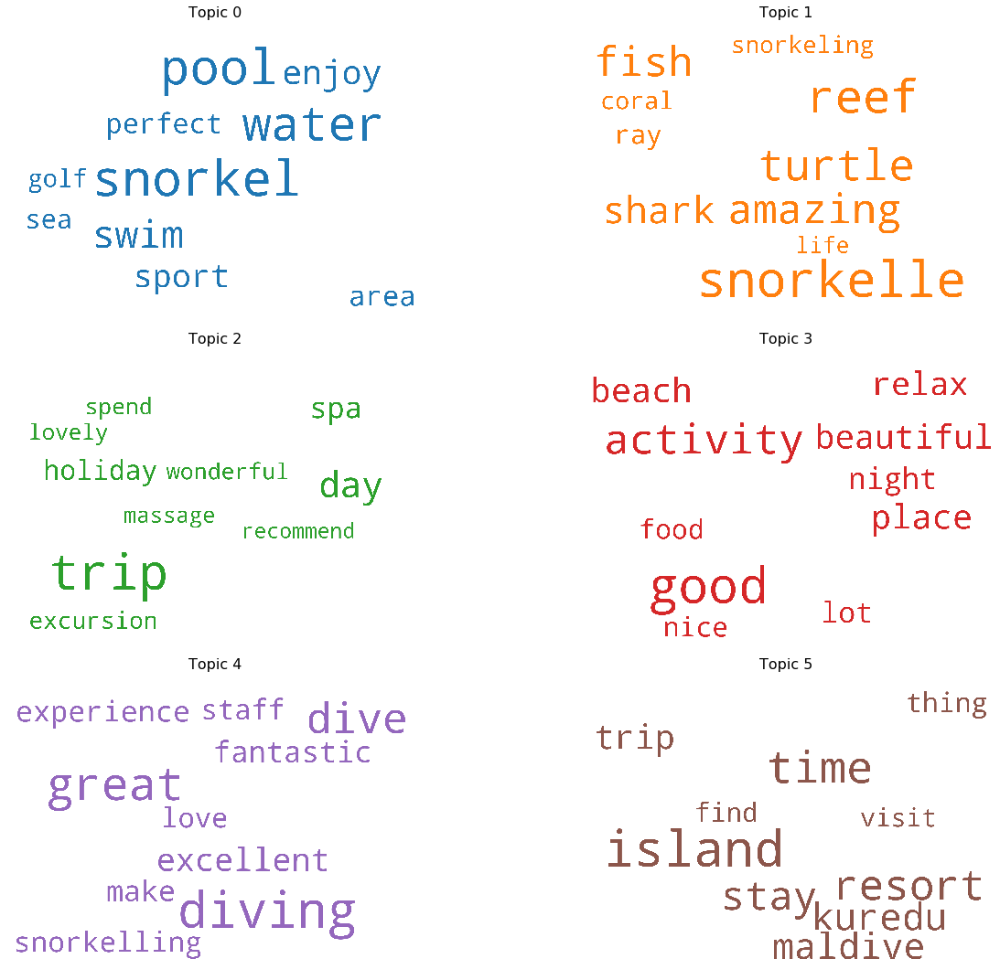

In [142]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_fac, 3, 2)

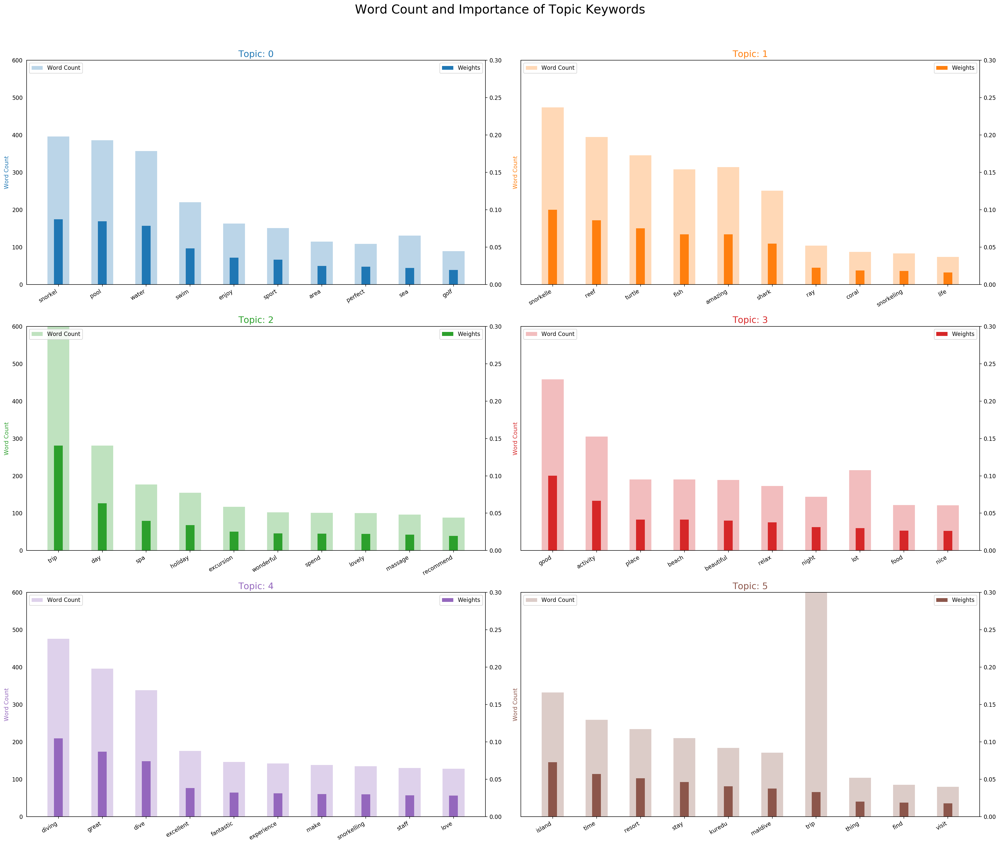

In [143]:
#Word counts of topic keywords
word_count_plot(gensim_lda_fac, data_lemmatized_fac, 3, 2, 0.30, 600)

In [144]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_fac, corpus_fac, K)

Loading BokehJS ...

In [145]:
#pyLDAVis
import pyLDAvis.gensim

model2_fac = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_fac)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_fac, corpus_fac, dictionary=id2word_fac)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.294216 -0.025684       1        1  16.792372
3      0.158066 -0.291260       2        1  16.748835
1      0.184508 -0.007307       3        1  16.699756
0      0.147599 -0.032255       4        1  16.675098
2     -0.294755 -0.023805       5        1  16.616748
4      0.098798  0.380310       6        1  16.467190, topic_info=           Term        Freq       Total Category  logprob  loglift
3          trip  948.000000  948.000000  Default  30.0000  30.0000
72       diving  566.000000  566.000000  Default  29.0000  29.0000
78         good  551.000000  551.000000  Default  28.0000  28.0000
39    snorkelle  566.000000  566.000000  Default  27.0000  27.0000
80      snorkel  478.000000  478.000000  Default  26.0000  26.0000
..          ...         ...         ...      ...      ...      ...
473         top   30.917755   30.917755   Topic6  -5.1659   1.8038
160  instructor   30.917755   30.917755   Topic6  -5.1659   1.8038
70    brilliant   71.348666   73.764939   Topic6  -4.3296   1.7705
388     snorkle   41.620055   42.815236   Topic6  -4.8686   1.7755
259     evening   34.485189   52.607237   Topic6  -5.0567   1.3815

[411 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
312       6  1.009129     absolutely
877       4  0.993265         access
356       2  0.989471  accommodation
986       4  0.945967         action
64        1  0.989805         active
...     ...       ...            ...
276       6  0.995113          worth
1088      1  1.031046     worthwhile
1232      3  0.836694            wow
97        1  1.004802           year
1230      2  1.108208      years_ago

[412 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 2, 1, 3, 5])

In [146]:
pyLDAvis.save_html(vis, 'facilities_vis_pyldavis.html')

In [147]:
fac_vis = Visualization()

for i, item in enumerate(gensim_lda_fac.show_topics(num_topics=6, num_words=10, formatted=False)):
    vtopic = fac_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        fac_vis.add_term(vtopic, term, weight=weight / maxWeight)

fac_vis.draw("facilities_vis.png")

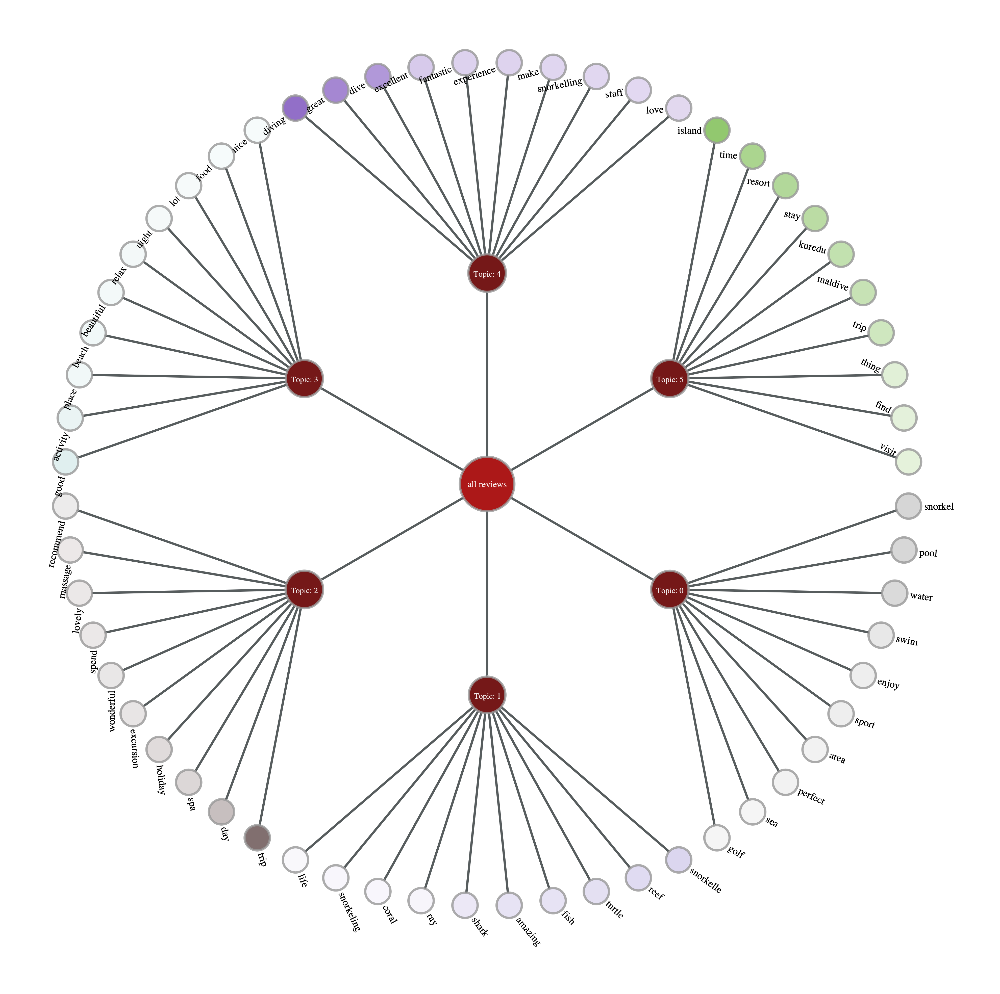

In [148]:
Image("facilities_vis.png")

## Other

In [149]:
other_df.head()

,ReviewNumber,Review,Rating
69,7,"We love the island and the warm weather, walking bare foot in the white soft sand and snorkling ...",0.9100
128,22,"Plenty to occupy yourself with or just laze in the sun, but this would be a waste.",-0.5719
147,27,Great weather / accommodation / climate / all what I imagined the weather to be.,0.6249
186,36,In my opinion the most important thing is the weather so I recommend to visit between january an...,0.8602
679,149,"Snorkelling was tricky due to the weather, but I cannot say it enough, the weather did not…",-0.0772


In [150]:
other_df.shape

(647, 3)

In [151]:
#mean rating overall
print('Average other rating:', other_df.Rating.mean())
print('Average other rating when transformed into the range 1-5: ', (other_df.Rating.mean()+1)*(5/2))

Average other rating: 0.3810503863987636
Average other rating when transformed into the range 1-5:  3.452625965996909


[Text(0.5, 0, '')]

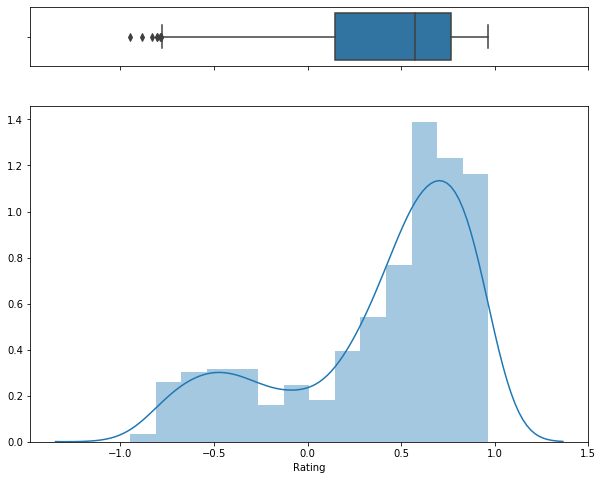

In [152]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(10, 8), gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(other_df["Rating"], ax=ax_box)
sns.distplot(other_df["Rating"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

#### Data prep

In [153]:
other_vals = other_df.Review.values

corpus_other, data_lemmatized_other, texts_other, id2word_other = data_prep(other_vals)

#### Topic modelling

In [154]:
K = 4

gensim_lda_other = gensim.models.wrappers.LdaMallet(mallet_path,
                                                    corpus=corpus_other,
                                                    num_topics=K,
                                                    id2word=id2word_other,
                                                    iterations=1000,
                                                    random_seed=1234)

In [155]:
#print 10 topics with 10 words per topic
pprint(gensim_lda_other.show_topics(num_topics=10, num_words=30, formatted=False))

[(0,
  [('weather', 0.12203112203112203),
   ('stay', 0.03931203931203931),
   ('week', 0.03521703521703522),
   ('perfect', 0.0343980343980344),
   ('hot', 0.031122031122031123),
   ('island', 0.029484029484029485),
   ('water', 0.027846027846027847),
   ('bad', 0.02620802620802621),
   ('beautiful', 0.025389025389025387),
   ('warm', 0.020475020475020474),
   ('food', 0.019656019656019656),
   ('clear', 0.018837018837018837),
   ('kuredu', 0.015561015561015561),
   ('make', 0.015561015561015561),
   ('couple', 0.013923013923013924),
   ('wonderful', 0.013923013923013924),
   ('sit', 0.013104013104013105),
   ('beach', 0.013104013104013105),
   ('sand', 0.013104013104013105),
   ('time', 0.013104013104013105),
   ('excellent', 0.011466011466011465),
   ('fly', 0.011466011466011465),
   ('walk', 0.010647010647010647),
   ('spend', 0.009828009828009828),
   ('life', 0.009828009828009828),
   ('area', 0.00819000819000819),
   ('plenty', 0.00819000819000819),
   ('wait', 0.006552006552006

In [156]:
#Dominant topic and percentage contribution in each document
df_topic_sents_keywords_other = format_topics_sentences(gensim_lda_other, corpus_other, data_lemmatized_other)

#format
df_dominant_topic_other = df_topic_sents_keywords_other.reset_index()
df_dominant_topic_other.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic_other.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.3056,"weather, stay, week, perfect, hot, island, water, bad, beautiful, warm","[warm, weather, walk, bare, foot, white, soft, sand, snorkle, clear, warm, turquoise, water, hop..."
1,1,0.0,0.2788,"weather, stay, week, perfect, hot, island, water, bad, beautiful, warm","[plenty, would, waste]"
2,2,3.0,0.2708,"weather, good, great, time, sea, season, storm, rainy, sunny, shower","[great, weather, accommodation, climate, imagine, weather]"
3,3,3.0,0.2672,"weather, good, great, time, sea, season, storm, rainy, sunny, shower","[opinion, important, thing, weather, recommend, visit, good, month]"
4,4,3.0,0.2677,"weather, good, great, time, sea, season, storm, rainy, sunny, shower","[snorkelle, tricky, due, weather, can, say, enough, weather]"
5,5,0.0,0.2690,"weather, stay, week, perfect, hot, island, water, bad, beautiful, warm","[beauty, place, quality, even, small, detail, weather, friendlyness, efficiency, people, work, t..."
6,6,1.0,0.2672,"rain, day, holiday, night, place, lovely, thing, sunshine, nice, heavy","[worried, rain, arrive, thankfully, weather, great, second, day, trip]"
7,7,2.0,0.2636,"sun, amazing, year, lot, maldive, visit, experience, resort, bit, deck","[nice, daybed, sunbed, could, bake, sun]"
8,8,3.0,0.2682,"weather, good, great, time, sea, season, storm, rainy, sunny, shower","[weather, could, well, time]"
9,9,0.0,0.2719,"weather, stay, week, perfect, hot, island, water, bad, beautiful, warm","[spend, week, wonderful, resort, firstly, maldive, rain]"


In [157]:
#combine with raw review text, wort by topic and save
other_df.reset_index(drop=True, inplace=True)
df_dominant_topic_other.reset_index(drop=True, inplace=True)

df_other = pd.concat([df_dominant_topic_other, other_df], axis=1)
df_other = df_other.sort_values(by=['Dominant_Topic'])

#save
df_other.to_csv(r'data/df_other_topics.csv', index = False)

In [158]:
#Most representative sentence
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_other = pd.DataFrame()
sent_topics_outdf_grpd_other = df_topic_sents_keywords_other.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd_other:
    sent_topics_sorteddf_other = pd.concat([sent_topics_sorteddf_other, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

#reset Index    
sent_topics_sorteddf_other.reset_index(drop=True, inplace=True)

#format
sent_topics_sorteddf_other.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

#show
sent_topics_sorteddf_other.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.3398,"weather, stay, week, perfect, hot, island, water, bad, beautiful, warm","[spend, time, snorkelle, relax, walk, island, beautiful, weather, wonderful, food]"
1,1.0,0.3637,"rain, day, holiday, night, place, lovely, thing, sunshine, nice, heavy","[turn, thankfully, day, mix, weather, usually, sunny, morning, lunch, rain, cloudy, windy, day, ..."
2,2.0,0.3581,"sun, amazing, year, lot, maldive, visit, experience, resort, bit, deck","[good, deck, area, low, deck, sun, lounger, sit, watch, fish, shark, ray, hungry, trigger, fish]"
3,3.0,0.3419,"weather, good, great, time, sea, season, storm, rainy, sunny, shower","[weather, sometime, rain, follow, day, nice, sunny, good, big, problem, internet, connection, da..."


In [159]:
sent_topics_sorteddf_other.to_csv(r'data/sent_topics_sorteddf_other.csv', index = False)

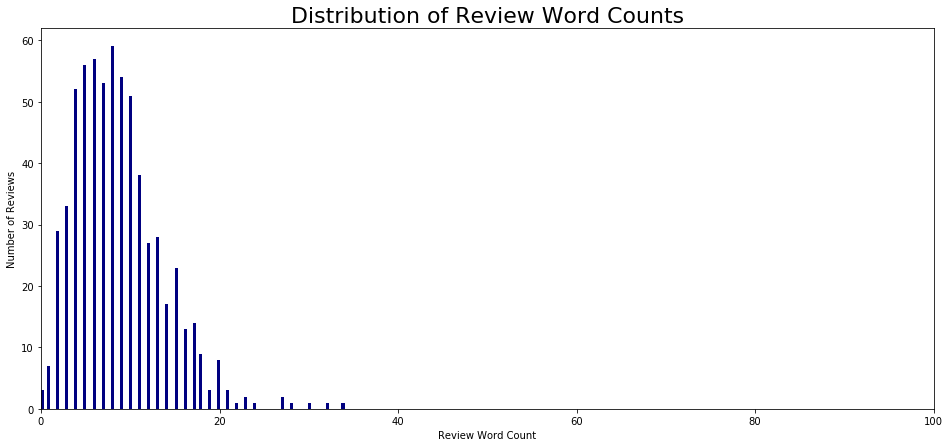

In [160]:
#frequency distribution or word counts in documents
plot_dist_word_count(df_dominant_topic_other)

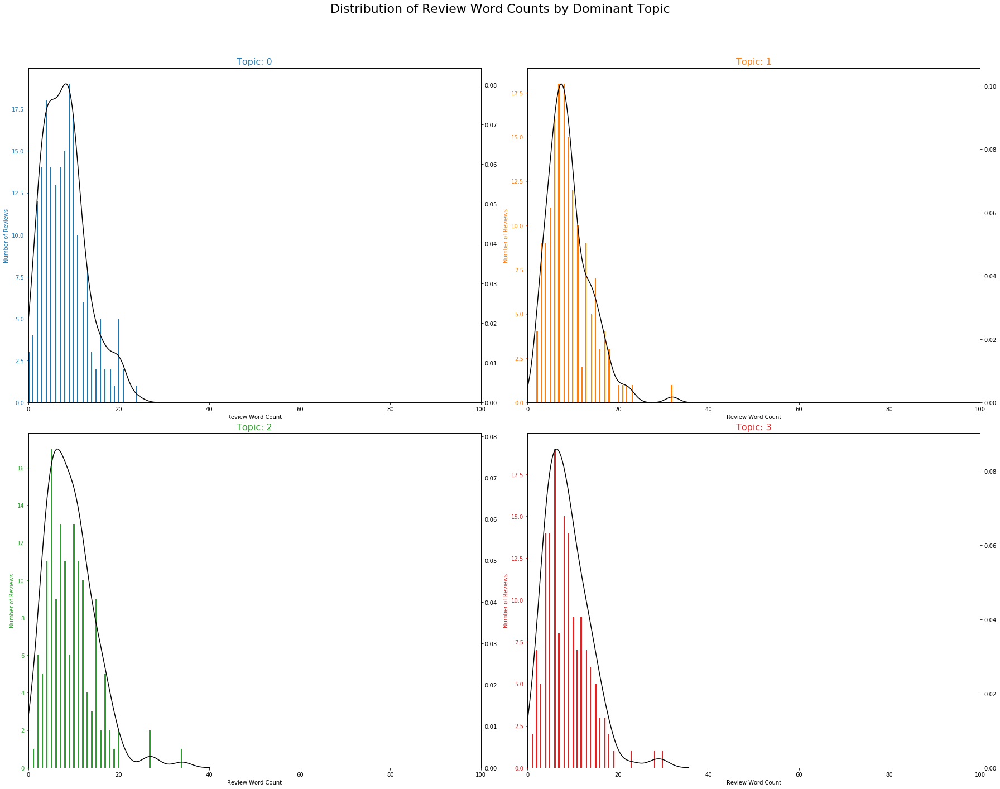

In [161]:
plot_dist_word_count_topic(2, 2, df_dominant_topic_other)

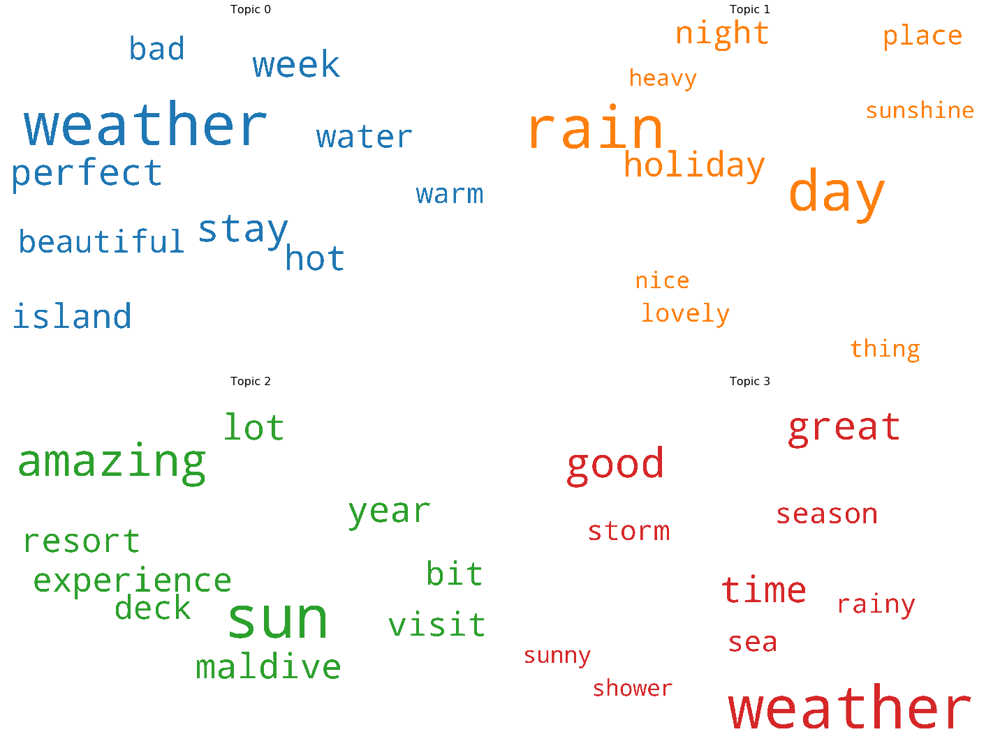

In [162]:
#Word clouds for top N keywords in each topic
word_cloud(gensim_lda_other, 2, 2)

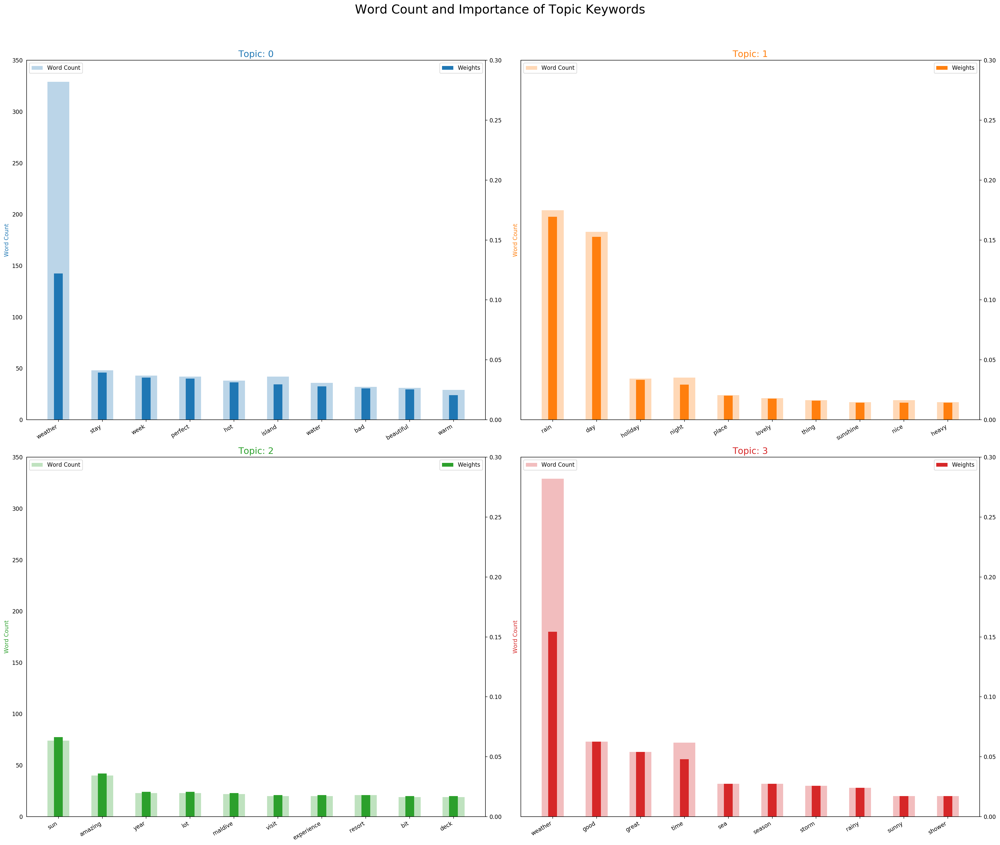

In [163]:
#Word counts of topic keywords
word_count_plot(gensim_lda_other, data_lemmatized_other, 2, 2, 0.30, 350)

In [164]:
#t-SNE Clustering Chart
tsne_cluster_chart(gensim_lda_other, corpus_other, K)

Loading BokehJS ...

In [165]:
#pyLDAVis
import pyLDAvis.gensim

model2_other = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(gensim_lda_other)

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model2_other, corpus_other, dictionary=id2word_other)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.165880 -0.377507       1        1  25.178644
0      0.235414  0.067224       2        1  24.982360
3      0.247805  0.035422       3        1  24.919641
2     -0.317339  0.274860       4        1  24.919355, topic_info=        Term        Freq       Total Category  logprob  loglift
49      rain  243.000000  243.000000  Default  30.0000  30.0000
3        day  218.000000  218.000000  Default  29.0000  29.0000
13   weather  391.000000  391.000000  Default  28.0000  28.0000
58       sun   93.000000   93.000000  Default  27.0000  27.0000
22      good   88.000000   88.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
102    clean   11.424909   11.424909   Topic4  -4.8194   1.3895
261     fish   11.424909   11.424909   Topic4  -4.8194   1.3895
64    resort   25.388688   26.550848   Topic4  -4.0209   1.3448
344    relax   13.963778   22.098902   Topic4  -4.6187   0.9305
166   strong   11.424909   12.587070   Topic4  -4.8194   1.2927

[269 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
587       1  1.006050  absolutely
129       4  1.004384     amazing
654       3  0.824481     aquatic
157       2  1.032560        area
317       1  1.006050     arrival
...     ...       ...         ...
139       4  1.024078        wind
411       4  0.787752    windsurf
67        2  1.012313   wonderful
256       1  0.958143       worry
100       4  0.993253        year

[255 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 4, 3])

In [166]:
pyLDAvis.save_html(vis, 'other_vis_pyldavis.html')

In [167]:
other_vis = Visualization()

for i, item in enumerate(gensim_lda_other.show_topics(num_topics=4, num_words=10, formatted=False)):
    vtopic = other_vis.add_topic("Topic: " + str(i))
    
    maxWeight = 0.0
    for term, weight in item[1]:
        maxWeight = max(maxWeight, weight)
    
    for term, weight in item[1]:
        other_vis.add_term(vtopic, term, weight=weight / maxWeight)

other_vis.draw("other_vis.png")

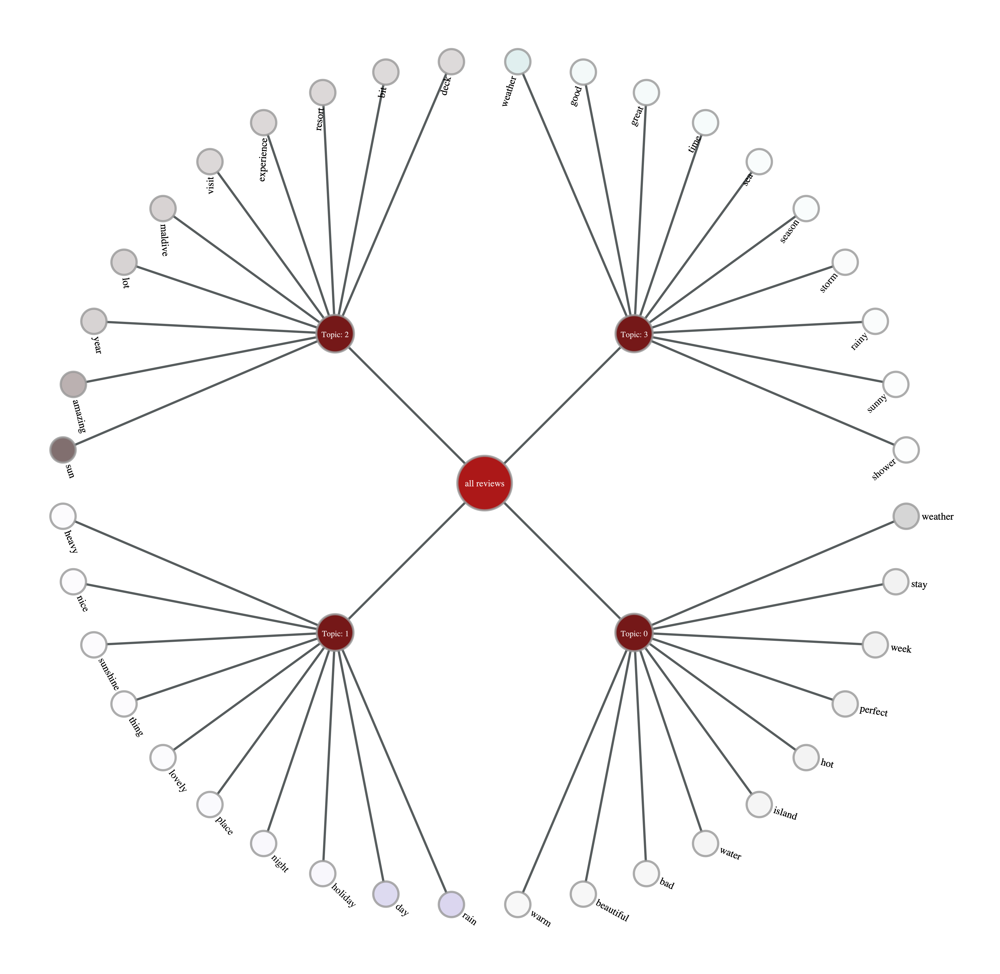

In [168]:
Image("other_vis.png")